Connected to base (Python 3.11.7)

In [1]:
from FirstSteps import column_converter,feature_skew_check
from stall_margin_formulas import HPCStallMargin
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.preprocessing import PolynomialFeatures,StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np




In [2]:
FD001_data_training, _ = column_converter('CMAPSSData/train_FD001.txt')

FD001_data_test, _ = column_converter('CMAPSSData/test_FD001.txt')

print(FD001_data_training.shape)
print(FD001_data_test.shape)

no failures converting dataframe columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20630 entries, 0 to 20629
Data columns (total 26 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Engine                                20630 non-null  int64  
 1   Cycles                                20630 non-null  int64  
 2   Operational Setting 1                 20630 non-null  float64
 3   Operational Setting 2                 20630 non-null  float64
 4   Operational Setting 3                 20630 non-null  float64
 5   Fan inlet temperature ◦R              20630 non-null  float64
 6   LPC outlet temperature ◦R             20630 non-null  float64
 7   HPC outlet temperature ◦R             20630 non-null  float64
 8   LPT outlet temperature ◦R             20630 non-null  float64
 9   Fan inlet Pressure psia               20630 non-null  float64
 10  bypass-duct pressure psia             206

In [3]:
#Istantiating formulas dataclass
hpc_training = HPCStallMargin()
FD001_data_formulas_training = hpc_training.calculate_health_metrics(FD001_data_training)
stall_margin_failure_threshold_training = hpc_training.stall_margin_failure_threshold

# add wear manifest to df

FD001_data_training['Baseline_Efficiency']= hpc_training.Baseline_Efficiency
FD001_data_training['Initial_Wear_HPT_Efficiency'] = hpc_training.Initial_Wear_HPT_Efficiency
FD001_data_training['Initial_Wear_HPT_Flow'] = hpc_training.Initial_Wear_HPT_Flow

#Wear 3000 Cycles
FD001_data_training['Wear_HPT_Efficiency_3000'] = hpc_training.Wear_HPT_Efficiency_3000
FD001_data_training['Wear_HPT_Flow_3000'] = hpc_training.Wear_HPT_Flow_3000

#Wear 6000 Cycles
FD001_data_training['Wear_HPT_Efficiency_6000'] = hpc_training.Wear_HPT_Efficiency_6000
FD001_data_training['Wear_HPT_Flow_6000'] = hpc_training.Wear_HPT_Flow_6000

In [4]:
hpc_test = HPCStallMargin()
FD001_data_formulas_test = hpc_test.calculate_health_metrics(FD001_data_test)
stall_margin_failure_threshold_test = hpc_test.stall_margin_failure_threshold

FD001_data_test['Baseline_Efficiency']= hpc_training.Baseline_Efficiency
FD001_data_test['Initial_Wear_HPT_Efficiency'] = hpc_training.Initial_Wear_HPT_Efficiency
FD001_data_test['Initial_Wear_HPT_Flow'] = hpc_training.Initial_Wear_HPT_Flow

#Wear 3000 Cycles
FD001_data_test['Wear_HPT_Efficiency_3000'] = hpc_training.Wear_HPT_Efficiency_3000
FD001_data_test['Wear_HPT_Flow_3000'] = hpc_training.Wear_HPT_Flow_3000

#Wear 6000 Cycles
FD001_data_test['Wear_HPT_Efficiency_6000'] = hpc_training.Wear_HPT_Efficiency_6000
FD001_data_test['Wear_HPT_Flow_6000'] = hpc_training.Wear_HPT_Flow_6000



In [5]:
print(FD001_data_test.isna().sum())  # Check for missing values in FD001_data_test


Engine                                  0
Cycles                                  0
Operational Setting 1                   0
Operational Setting 2                   0
Operational Setting 3                   0
Fan inlet temperature ◦R                0
LPC outlet temperature ◦R               0
HPC outlet temperature ◦R               0
LPT outlet temperature ◦R               0
Fan inlet Pressure psia                 0
bypass-duct pressure psia               0
HPC outlet pressure psia                0
Physical fan speed rpm                  0
Physical core speed rpm                 0
Engine pressure ratioP50/P2             0
HPC outlet Static pressure psia         0
Ratio of fuel flow to Ps30 pps/psia     0
Corrected fan speed rpm                 0
Corrected core speed rpm                0
Bypass Ratio                            0
Burner fuel-air ratio                   0
Bleed Enthalpy                          0
Required fan speed                      0
Required fan conversion speed     

In [6]:
max_engine_cycles = FD001_data_training.groupby("Engine")[['Cycles']].agg(max)

print(max_engine_cycles)



max_engine_cycles_test = FD001_data_test.groupby("Engine")[['Cycles']].agg(max)
print(max_engine_cycles_test)

        Cycles
Engine        
1          192
2          287
3          179
4          189
5          269
...        ...
96         336
97         202
98         156
99         185
100        200

[100 rows x 1 columns]
        Cycles
Engine        
1           31
2           49
3          126
4          106
5           98
...        ...
96          97
97         134
98         121
99          97
100        198

[100 rows x 1 columns]


In [7]:
# Initialize a list to store results
engine_result = []
r2_scores_data = []

unique_engines = FD001_data_training['Engine'].unique()


mse train: 0.0001742650292471942
mse_test: 0.00014120728159556177


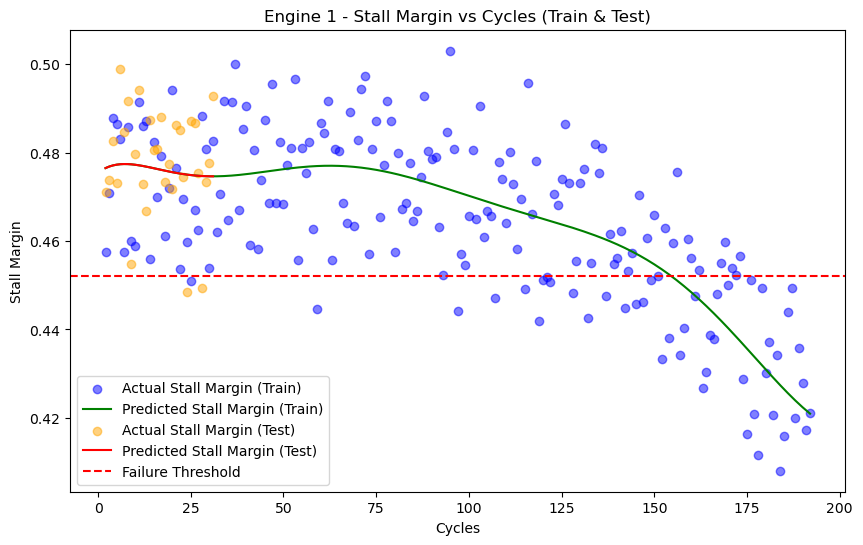

Engine 1 - R2 score (Train): 0.548754690405103
Training: Stall margin breaches the threshold at cycle 162, predicted value 0.4468942799162093
Remaining useful life (Train): 30
mse train: 0.0001582511148282871
mse_test: 0.0008066908522304245


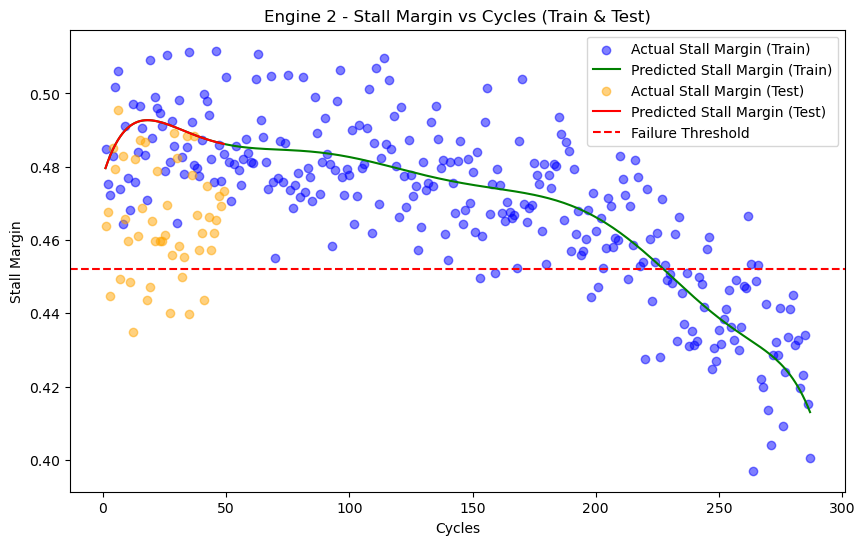

Engine 2 - R2 score (Train): 0.6893781406860082
Training: Stall margin breaches the threshold at cycle 235, predicted value 0.44739371934268485
Remaining useful life (Train): 52
mse train: 0.00014221878492444342
mse_test: 0.0004333514065933619


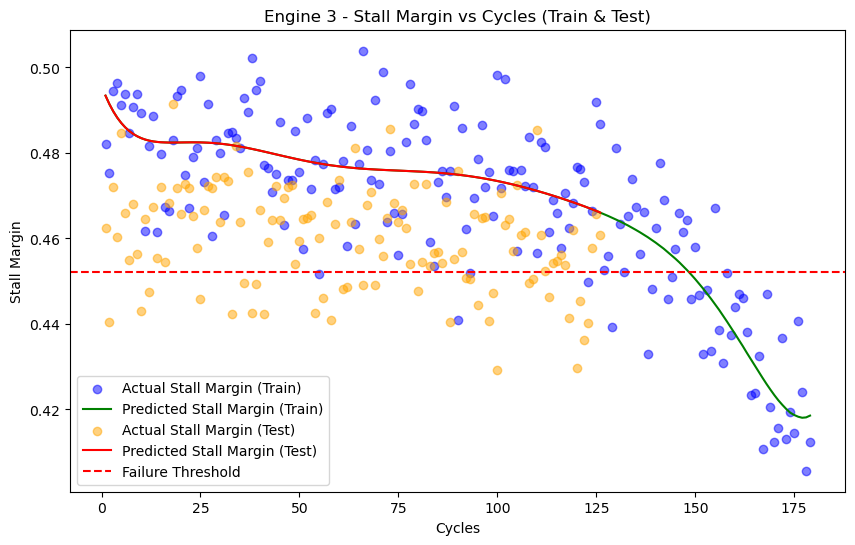

Engine 3 - R2 score (Train): 0.6870203506749116
Training: Stall margin breaches the threshold at cycle 153, predicted value 0.44707609207734184
Remaining useful life (Train): 26
mse train: 0.00014227000421406535
mse_test: 0.0002150928345783943


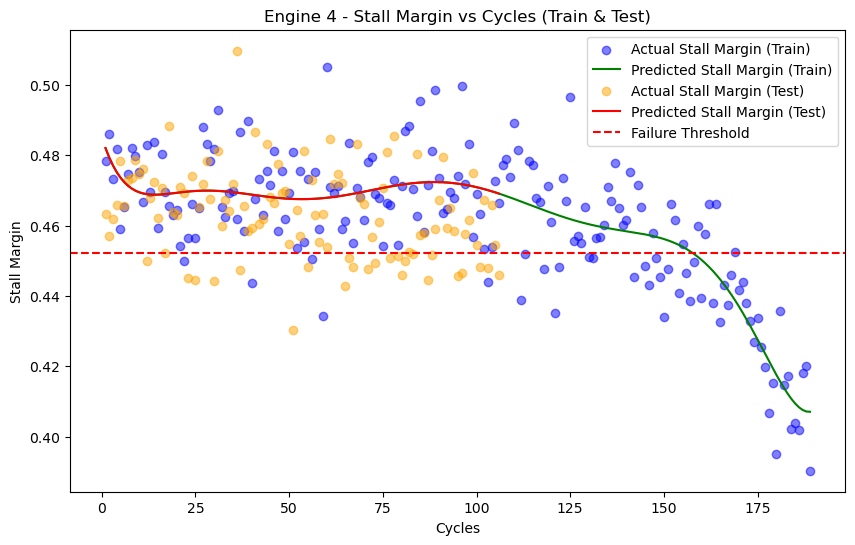

Engine 4 - R2 score (Train): 0.6516690703518417
Training: Stall margin breaches the threshold at cycle 163, predicted value 0.4471915280723411
Remaining useful life (Train): 26
mse train: 0.00017034849512044634
mse_test: 0.0006922304932300161


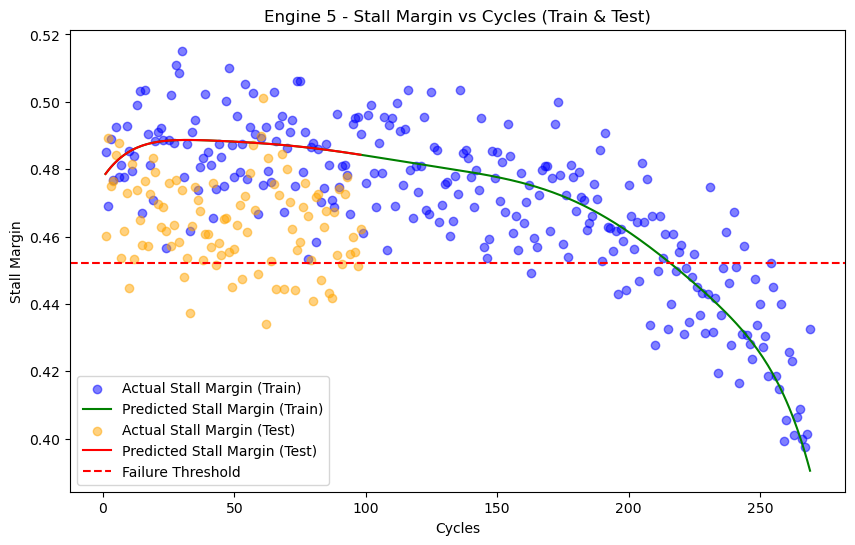

Engine 5 - R2 score (Train): 0.7029964632590838
Training: Stall margin breaches the threshold at cycle 223, predicted value 0.4474772505811432
Remaining useful life (Train): 46
mse train: 0.00014234852985858215
mse_test: 0.0001773840884668491


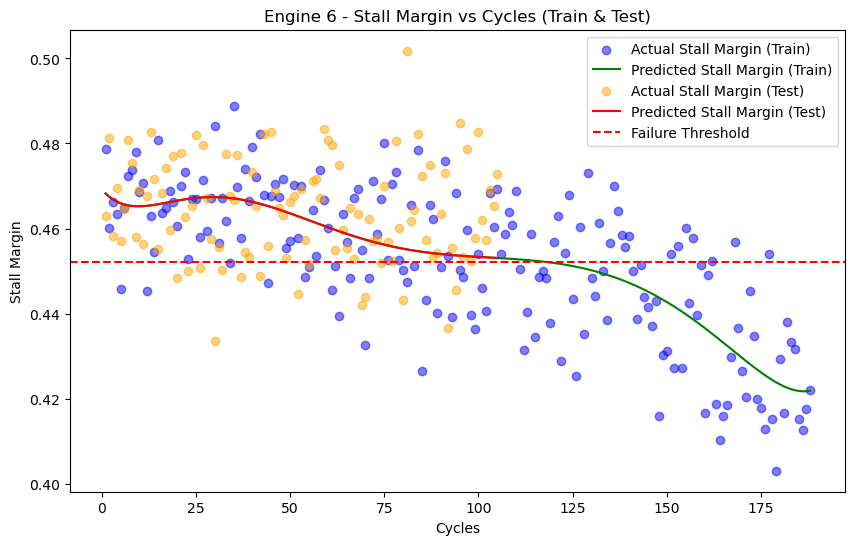

Engine 6 - R2 score (Train): 0.5404246167497407
Training: Stall margin breaches the threshold at cycle 140, predicted value 0.4472149763650411
Remaining useful life (Train): 48
mse train: 0.00013800916629112199
mse_test: 0.00019899482186596192


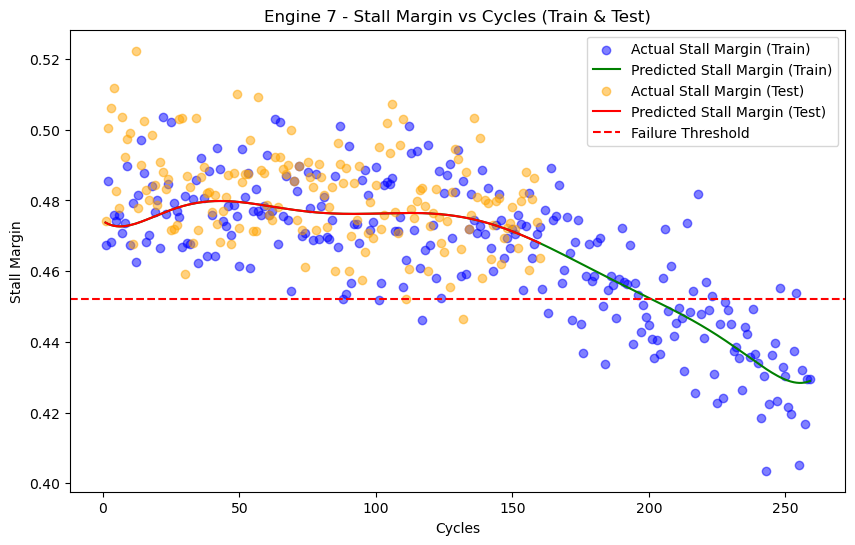

Engine 7 - R2 score (Train): 0.6480558645774256
Training: Stall margin breaches the threshold at cycle 213, predicted value 0.44731503607929485
Remaining useful life (Train): 46
mse train: 0.0001550639200235666
mse_test: 0.0010149076523276132


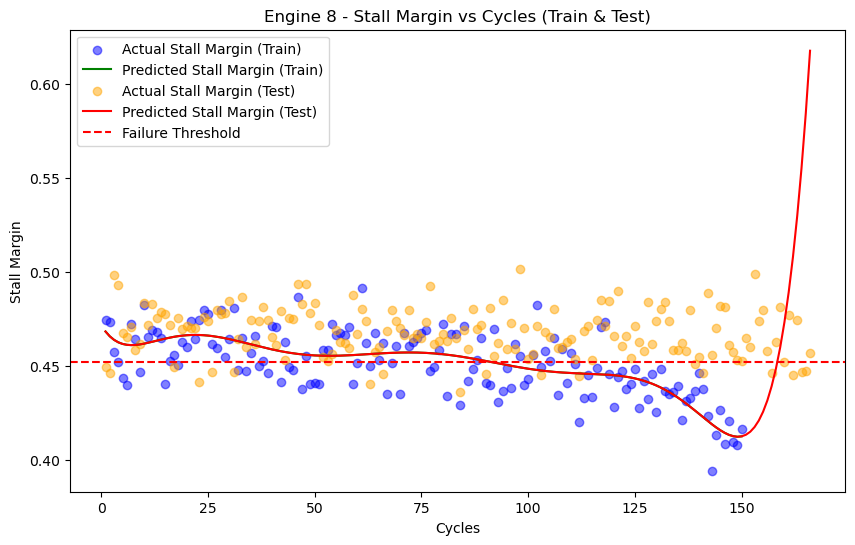

Engine 8 - R2 score (Train): 0.4899744657551478
Training: Stall margin breaches the threshold at cycle 103, predicted value 0.4474882295564429
Remaining useful life (Train): 47
Test: Stall margin breaches the threshold at cycle 92, predicted value 0.4517023971513526
Remaining useful life (Test): 74
mse train: 0.000153401335625025
mse_test: 0.0005569474704012912


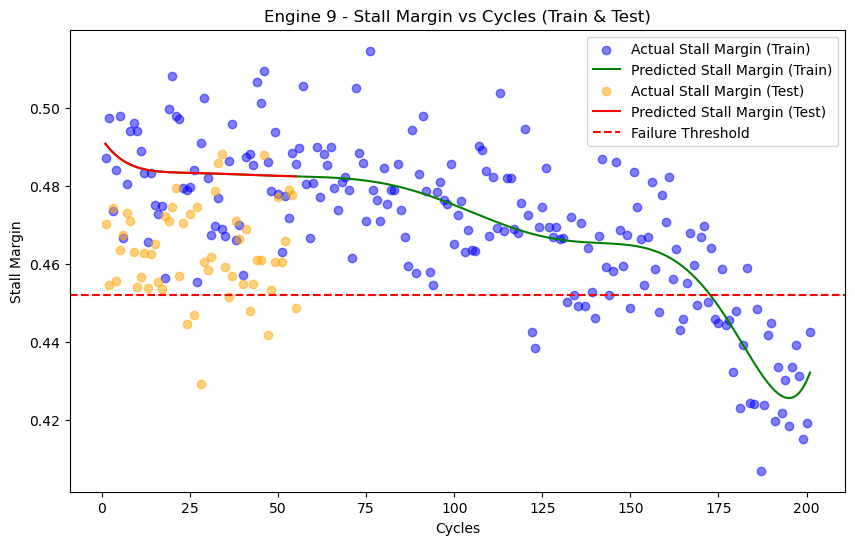

Engine 9 - R2 score (Train): 0.6320412770034163
Training: Stall margin breaches the threshold at cycle 177, predicted value 0.4464867837843991
Remaining useful life (Train): 24
mse train: 0.00016677727457390225
mse_test: 0.00014504650586864024


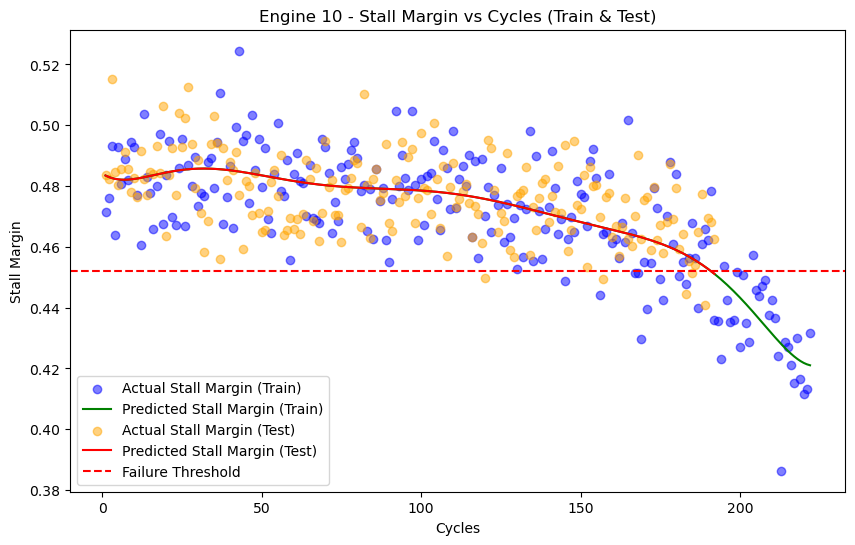

Engine 10 - R2 score (Train): 0.6277403753959176
Training: Stall margin breaches the threshold at cycle 196, predicted value 0.4474652613662203
Remaining useful life (Train): 26
Test: Stall margin breaches the threshold at cycle 191, predicted value 0.45193006649241046
Remaining useful life (Test): 1
mse train: 0.0001673868764865088
mse_test: 0.0008489022013276635


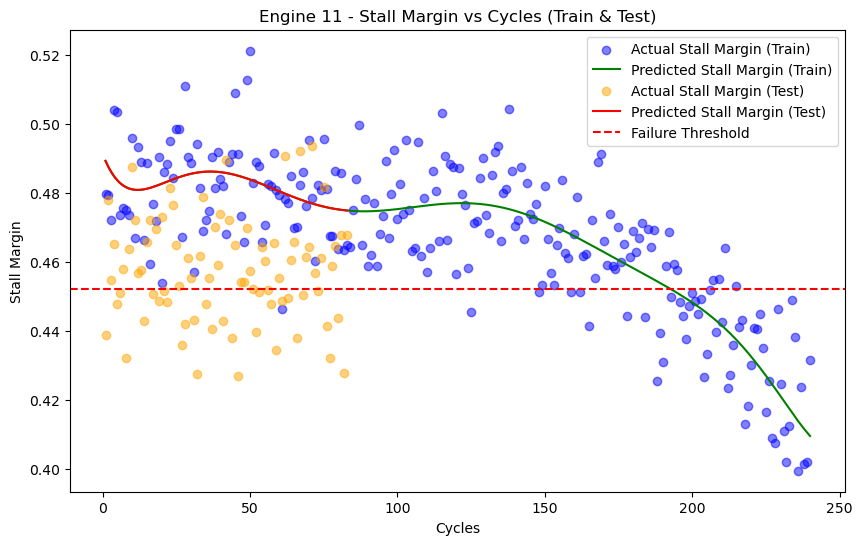

Engine 11 - R2 score (Train): 0.6723458967923739
Training: Stall margin breaches the threshold at cycle 202, predicted value 0.44701009863507957
Remaining useful life (Train): 38
mse train: 0.0001624060901365822
mse_test: 0.19803148030677423


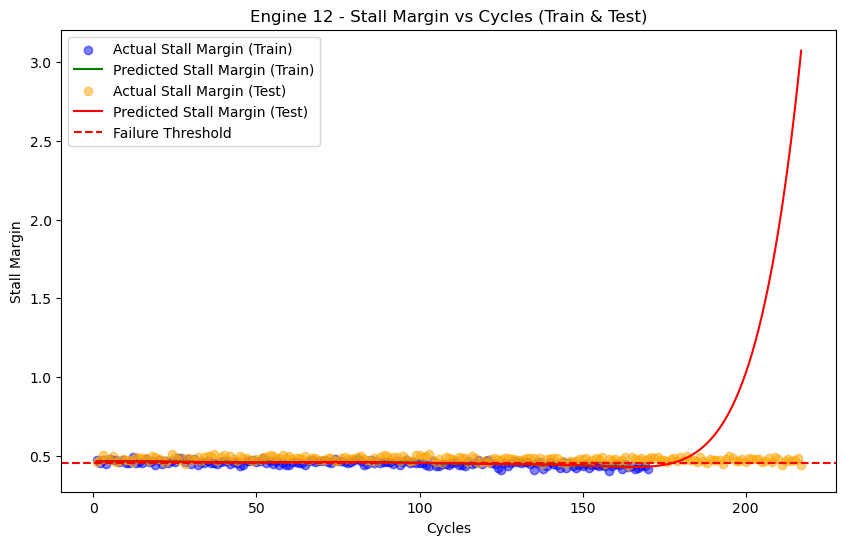

Engine 12 - R2 score (Train): 0.4091402138610225
Training: Stall margin breaches the threshold at cycle 127, predicted value 0.44741533952087725
Remaining useful life (Train): 43
Test: Stall margin breaches the threshold at cycle 109, predicted value 0.4520252125735637
Remaining useful life (Test): 108
mse train: 0.0001471160389769703
mse_test: 0.001561878675322202


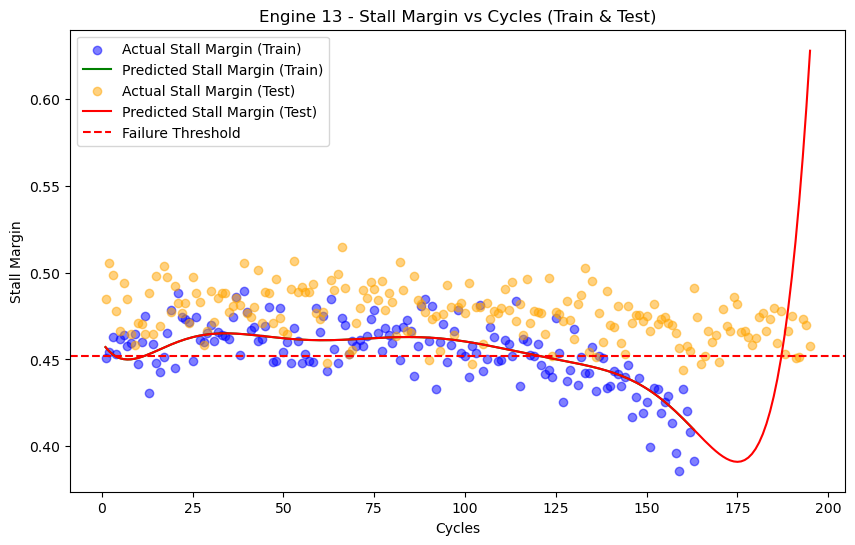

Engine 13 - R2 score (Train): 0.5828760858582822
Training: Stall margin breaches the threshold at cycle 132, predicted value 0.4472225529805977
Remaining useful life (Train): 31
Test: Stall margin breaches the threshold at cycle 4, predicted value 0.45158479594301526
Remaining useful life (Test): 191
mse train: 0.00013810465347997852
mse_test: 0.0001420898157887906


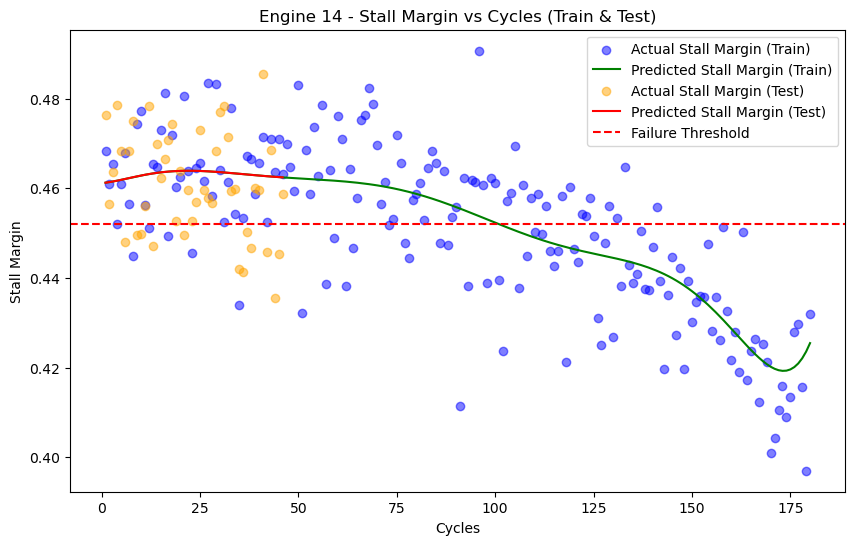

Engine 14 - R2 score (Train): 0.6067101373236987
Training: Stall margin breaches the threshold at cycle 116, predicted value 0.4473553161434261
Remaining useful life (Train): 64
mse train: 0.0001533260178238563
mse_test: 0.00027302969267833645


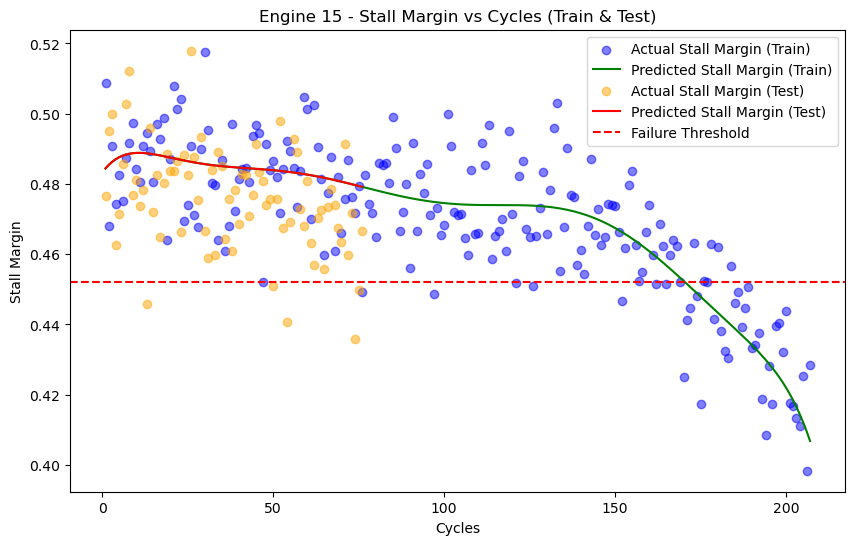

Engine 15 - R2 score (Train): 0.6765310589403521
Training: Stall margin breaches the threshold at cycle 176, predicted value 0.44701700172963116
Remaining useful life (Train): 31
mse train: 0.00018554748803658672
mse_test: 0.0005492752682733439


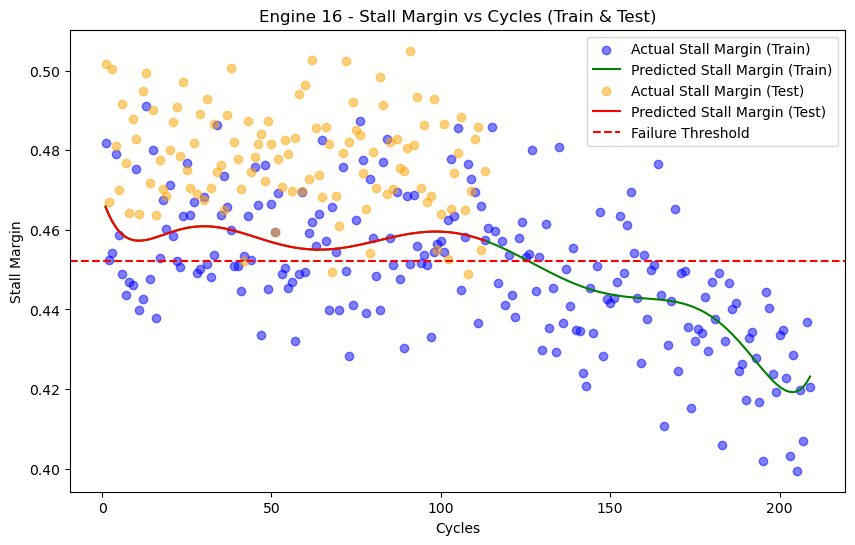

Engine 16 - R2 score (Train): 0.41766063733393244
Training: Stall margin breaches the threshold at cycle 137, predicted value 0.4473809154945003
Remaining useful life (Train): 72
mse train: 0.00014788767534006203
mse_test: 0.00020326587394456987


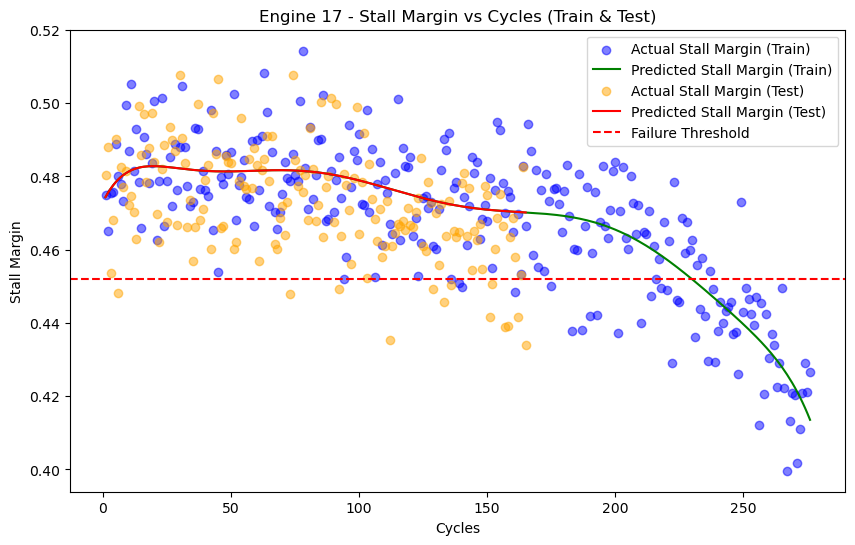

Engine 17 - R2 score (Train): 0.6530291122484437
Training: Stall margin breaches the threshold at cycle 238, predicted value 0.44718058733858096
Remaining useful life (Train): 38
mse train: 0.00014409576680741507
mse_test: 0.00023168097862168483


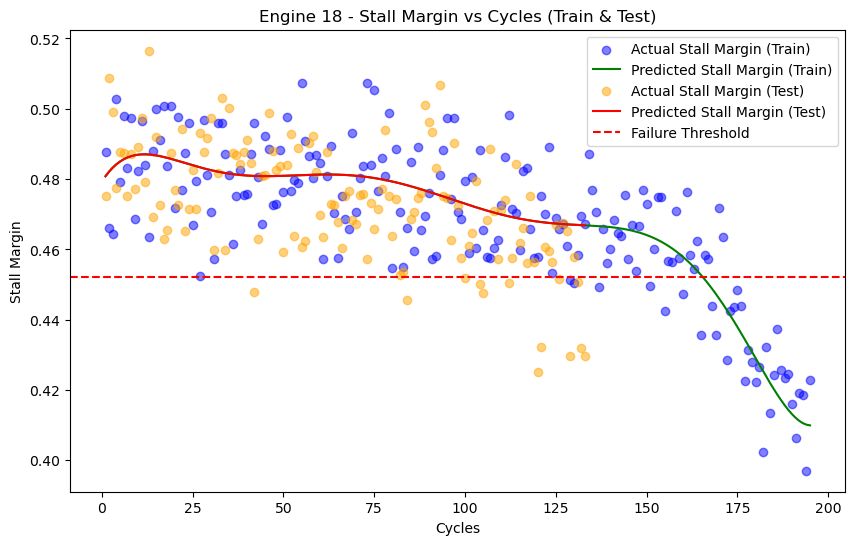

Engine 18 - R2 score (Train): 0.6982387644266517
Training: Stall margin breaches the threshold at cycle 169, predicted value 0.4474399577017144
Remaining useful life (Train): 26
mse train: 0.0001505593153769101
mse_test: 0.0008122509978020553


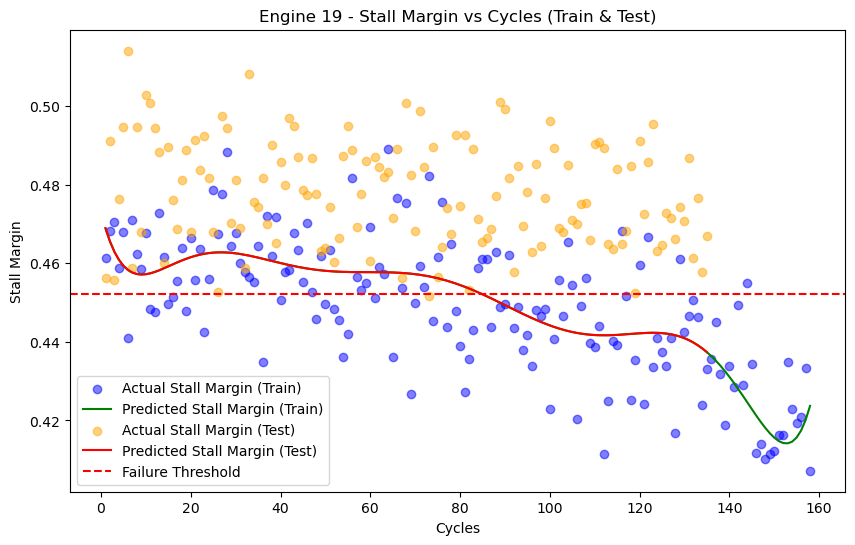

Engine 19 - R2 score (Train): 0.5012745862667165
Training: Stall margin breaches the threshold at cycle 94, predicted value 0.4471160802350558
Remaining useful life (Train): 64
Test: Stall margin breaches the threshold at cycle 86, predicted value 0.4515732857690371
Remaining useful life (Test): 49
mse train: 0.00013830073370640908
mse_test: 0.0002076743915327228


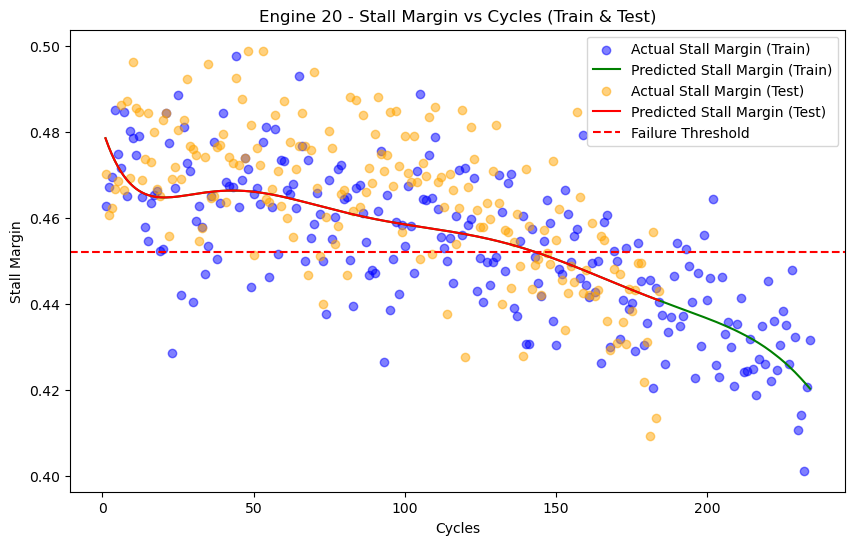

Engine 20 - R2 score (Train): 0.5422063335830438
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.4472676304262653
Remaining useful life (Train): 73
Test: Stall margin breaches the threshold at cycle 143, predicted value 0.45205763849435
Remaining useful life (Test): 41
mse train: 0.0001783247094440634
mse_test: 0.00026725191828000757


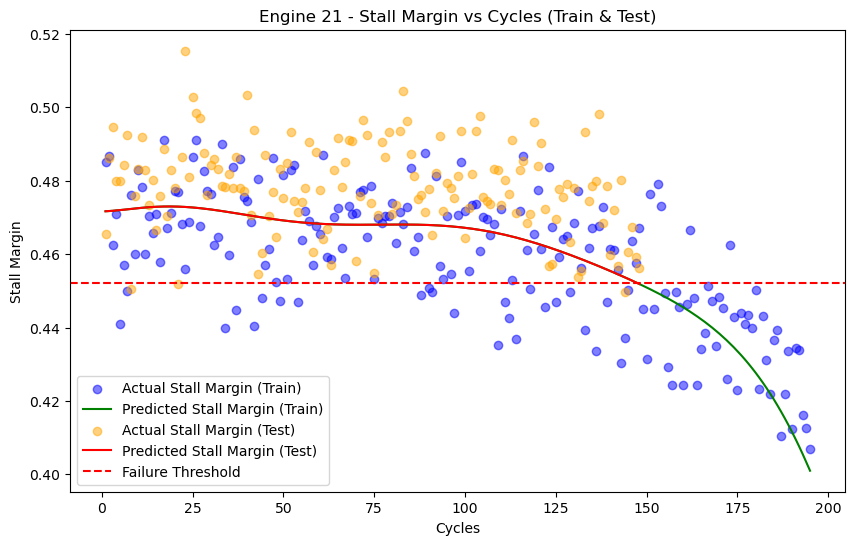

Engine 21 - R2 score (Train): 0.46202422152892597
Training: Stall margin breaches the threshold at cycle 157, predicted value 0.4473038177497031
Remaining useful life (Train): 38
Test: Stall margin breaches the threshold at cycle 148, predicted value 0.4518675144321563
Remaining useful life (Test): 0
mse train: 0.00013637183673305802
mse_test: 0.0002403863396702375


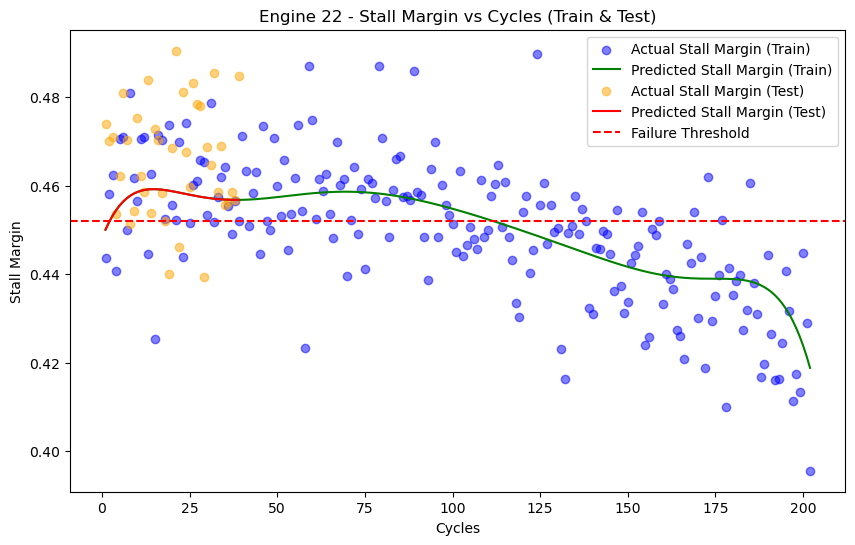

Engine 22 - R2 score (Train): 0.46364382992589814
Training: Stall margin breaches the threshold at cycle 129, predicted value 0.4473128094188817
Remaining useful life (Train): 73
Test: Stall margin breaches the threshold at cycle 1, predicted value 0.45005006162656475
Remaining useful life (Test): 38
mse train: 0.00013850227681922714
mse_test: 0.0006965942979088027


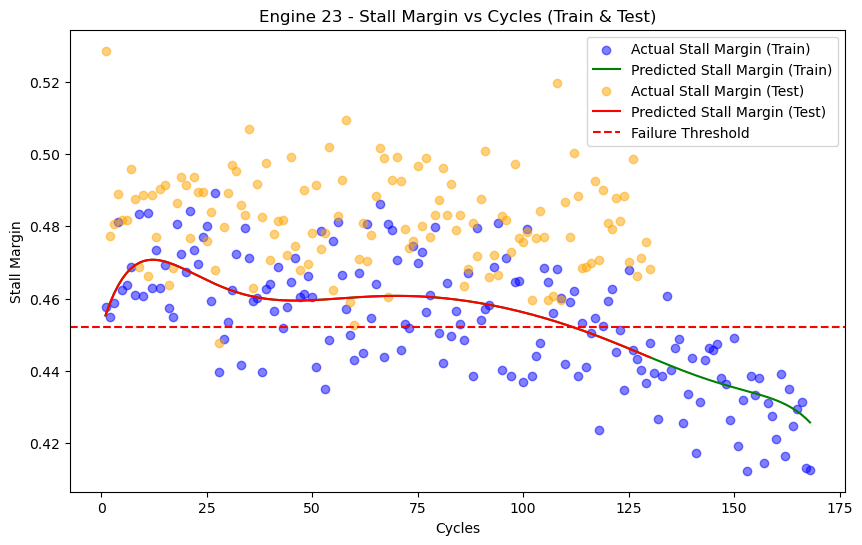

Engine 23 - R2 score (Train): 0.5393101295809963
Training: Stall margin breaches the threshold at cycle 123, predicted value 0.4472149647391742
Remaining useful life (Train): 45
Test: Stall margin breaches the threshold at cycle 112, predicted value 0.452071163765282
Remaining useful life (Test): 18
mse train: 0.00011761338549965187
mse_test: 0.5026427859837181


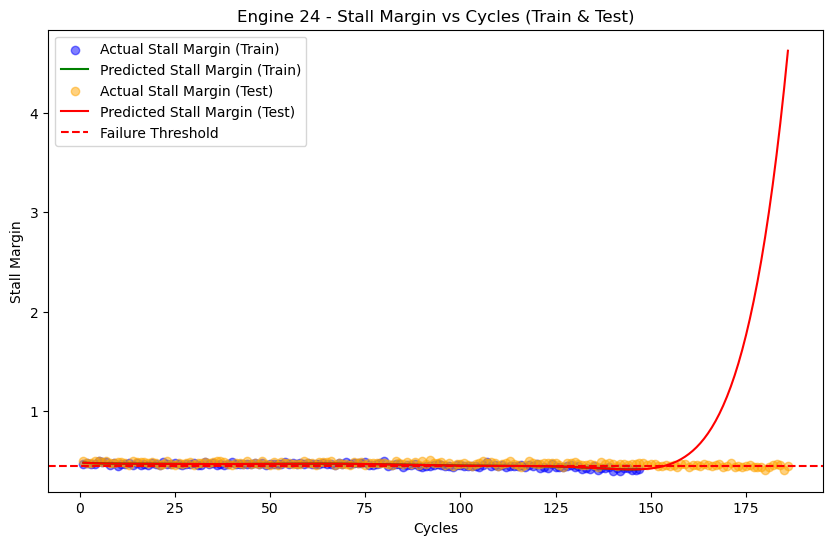

Engine 24 - R2 score (Train): 0.687543426451414
Training: Stall margin breaches the threshold at cycle 125, predicted value 0.4466000826756468
Remaining useful life (Train): 22
Test: Stall margin breaches the threshold at cycle 114, predicted value 0.4520628586138597
Remaining useful life (Test): 72
mse train: 0.00016177576513964336
mse_test: 0.000148606861557474


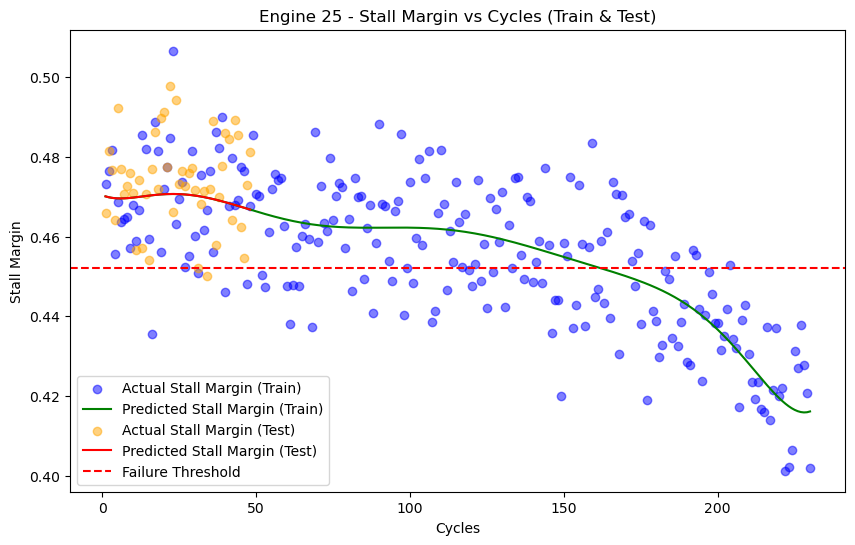

Engine 25 - R2 score (Train): 0.550981175813466
Training: Stall margin breaches the threshold at cycle 179, predicted value 0.44749269201316844
Remaining useful life (Train): 51
mse train: 0.00012145343198137934
mse_test: 0.00044146377483490935


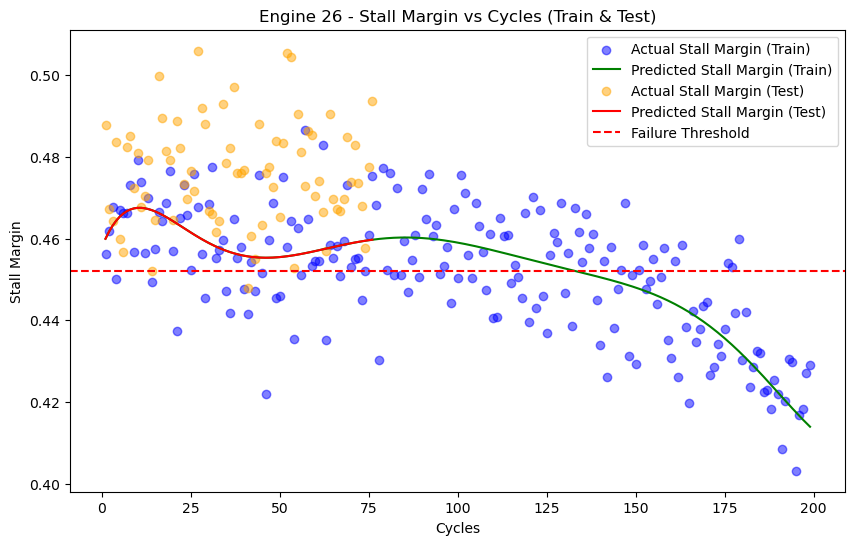

Engine 26 - R2 score (Train): 0.5050796006231151
Training: Stall margin breaches the threshold at cycle 152, predicted value 0.4473936192195221
Remaining useful life (Train): 47
mse train: 0.0001544916792043652
mse_test: 0.0005737114812607926


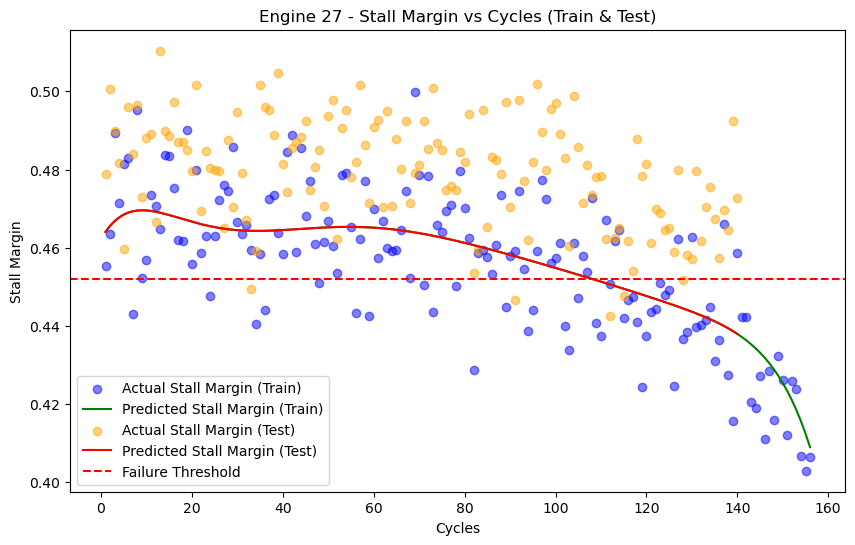

Engine 27 - R2 score (Train): 0.5812063408407254
Training: Stall margin breaches the threshold at cycle 121, predicted value 0.44726586127964796
Remaining useful life (Train): 35
Test: Stall margin breaches the threshold at cycle 108, predicted value 0.4520325937339479
Remaining useful life (Test): 32
mse train: 0.0001593319255542313
mse_test: 0.00029611609594451516


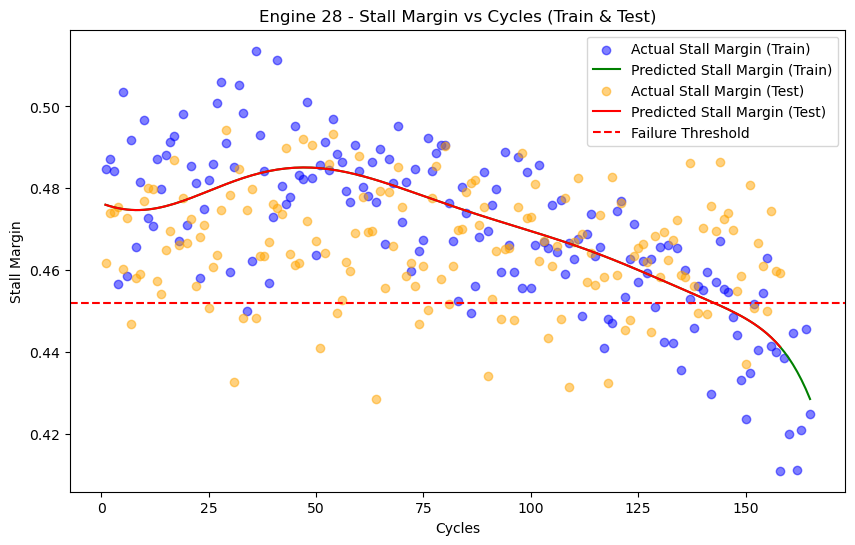

Engine 28 - R2 score (Train): 0.5971076678522975
Training: Stall margin breaches the threshold at cycle 152, predicted value 0.44689985932903165
Remaining useful life (Train): 13
Test: Stall margin breaches the threshold at cycle 143, predicted value 0.4518847149808871
Remaining useful life (Test): 15
mse train: 0.000145881364740821
mse_test: 0.0005876667901162821


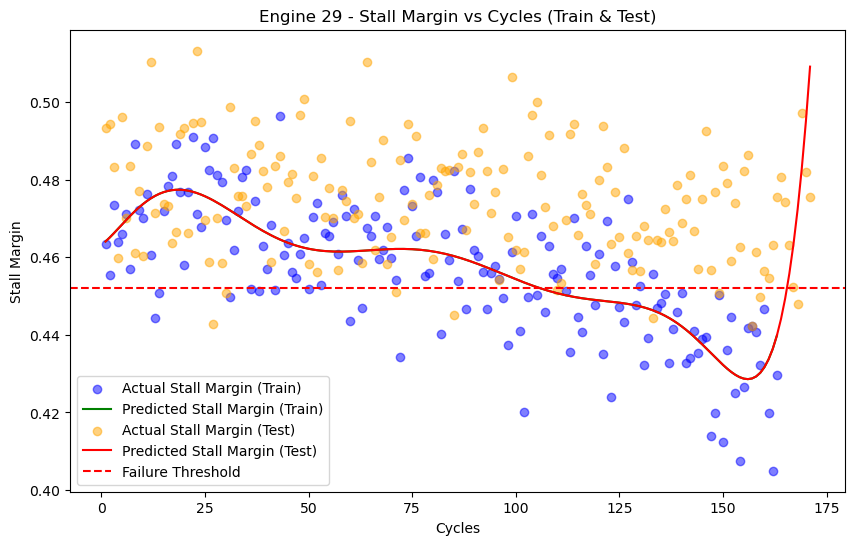

Engine 29 - R2 score (Train): 0.527908600742155
Training: Stall margin breaches the threshold at cycle 130, predicted value 0.44732967471131996
Remaining useful life (Train): 33
Test: Stall margin breaches the threshold at cycle 106, predicted value 0.45197438900718406
Remaining useful life (Test): 65
mse train: 0.00014622621552276327
mse_test: 0.0004807084447711499


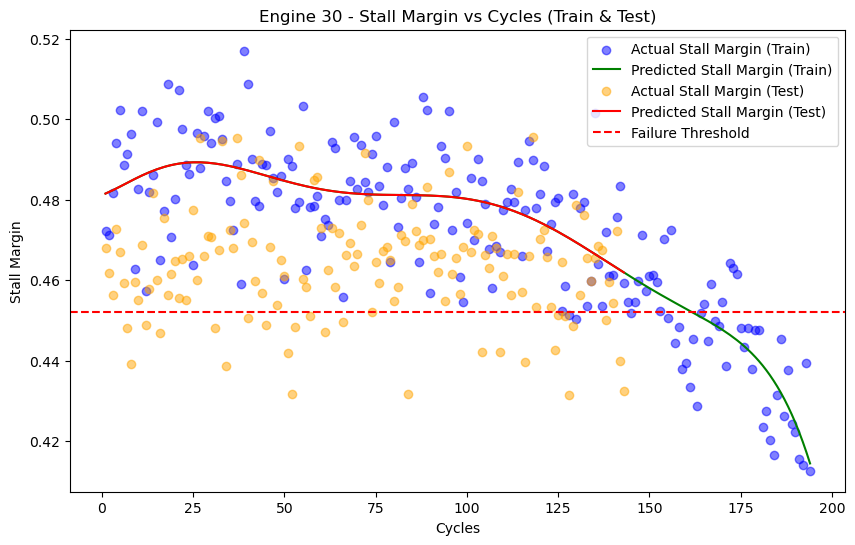

Engine 30 - R2 score (Train): 0.6849236568881416
Training: Stall margin breaches the threshold at cycle 171, predicted value 0.44706123536813974
Remaining useful life (Train): 23
mse train: 0.00015807238111660704
mse_test: 0.0002834702179770518


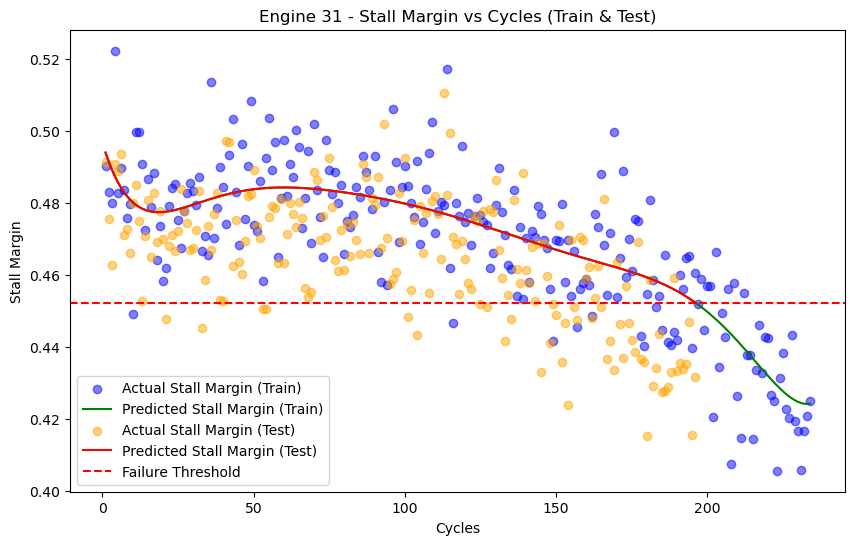

Engine 31 - R2 score (Train): 0.6698358113782923
Training: Stall margin breaches the threshold at cycle 204, predicted value 0.4467458139993371
Remaining useful life (Train): 30
mse train: 0.00014804822814116597
mse_test: 0.0006543003537763334


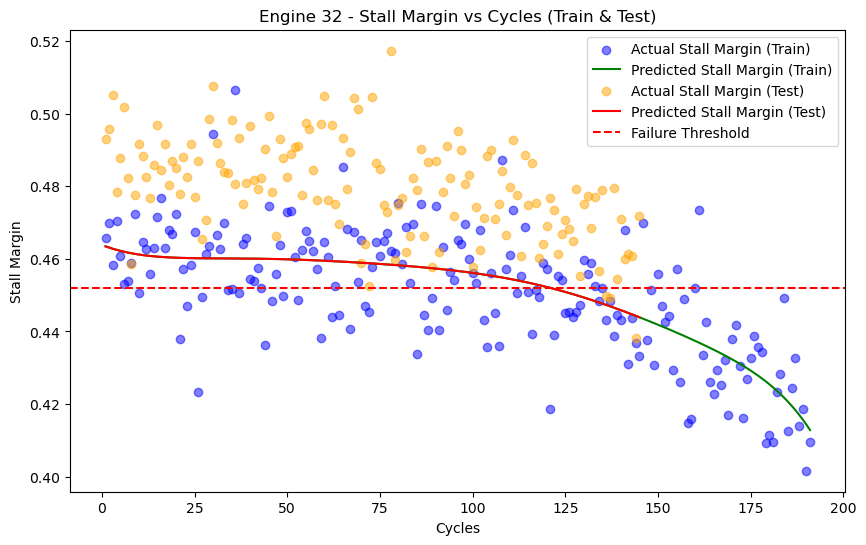

Engine 32 - R2 score (Train): 0.510877622327305
Training: Stall margin breaches the threshold at cycle 136, predicted value 0.44731512906952137
Remaining useful life (Train): 55
Test: Stall margin breaches the threshold at cycle 121, predicted value 0.4519864046852135
Remaining useful life (Test): 24
mse train: 0.00017271307900945678
mse_test: 0.0009225967210976011


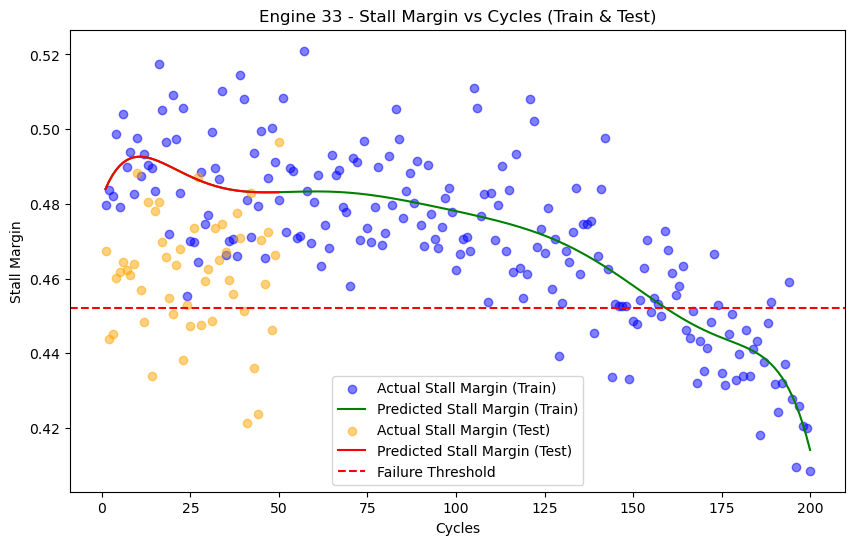

Engine 33 - R2 score (Train): 0.6572135797753516
Training: Stall margin breaches the threshold at cycle 168, predicted value 0.44719804267965235
Remaining useful life (Train): 32
mse train: 0.0001881367956936816
mse_test: 0.00045683368594110656


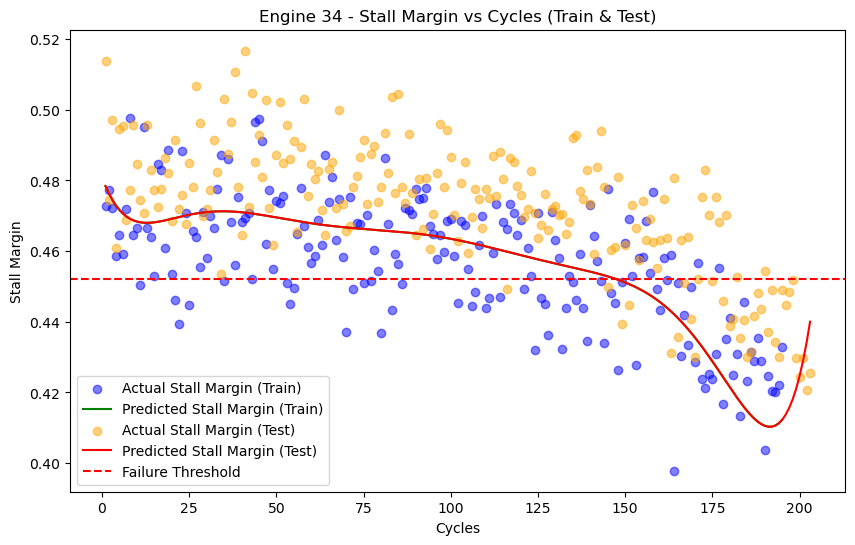

Engine 34 - R2 score (Train): 0.44878230036158007
Training: Stall margin breaches the threshold at cycle 158, predicted value 0.44695826694838064
Remaining useful life (Train): 37
Test: Stall margin breaches the threshold at cycle 148, predicted value 0.45187036768070715
Remaining useful life (Test): 55
mse train: 0.00013080585816630205
mse_test: 0.00023619554850905846


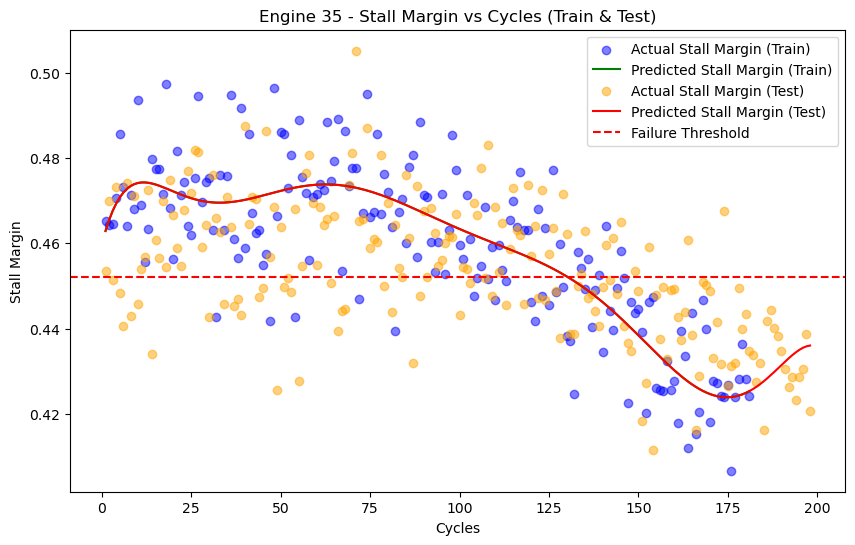

Engine 35 - R2 score (Train): 0.6644741660861182
Training: Stall margin breaches the threshold at cycle 139, predicted value 0.44689479537432397
Remaining useful life (Train): 42
Test: Stall margin breaches the threshold at cycle 131, predicted value 0.45170039005701745
Remaining useful life (Test): 67
mse train: 0.00013555096001809883
mse_test: 0.0001866274156631037


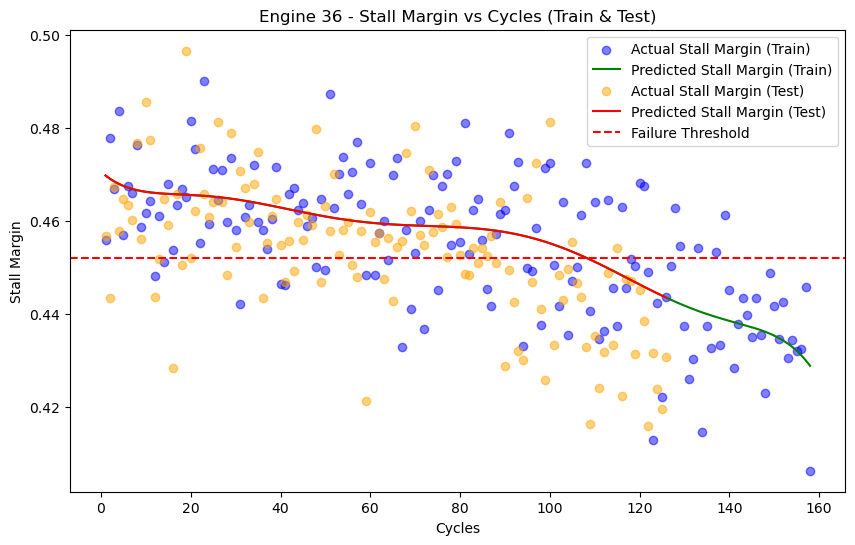

Engine 36 - R2 score (Train): 0.4220428260419622
Training: Stall margin breaches the threshold at cycle 118, predicted value 0.44737885749529
Remaining useful life (Train): 40
Test: Stall margin breaches the threshold at cycle 109, predicted value 0.45171868471990223
Remaining useful life (Test): 17
mse train: 0.0001635542671281405
mse_test: 0.0002799990775510754


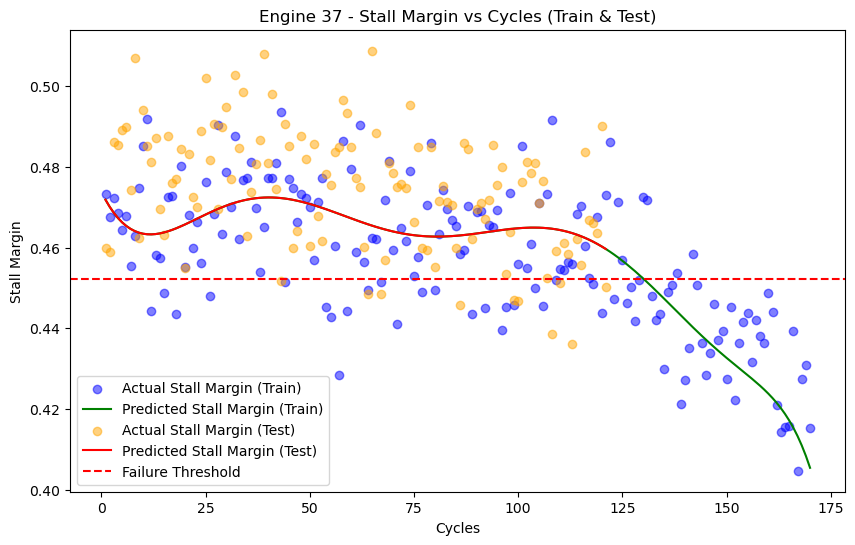

Engine 37 - R2 score (Train): 0.48738862506919944
Training: Stall margin breaches the threshold at cycle 135, predicted value 0.4473133923982545
Remaining useful life (Train): 35
mse train: 0.00017138403478941485
mse_test: 0.0001694600871089099


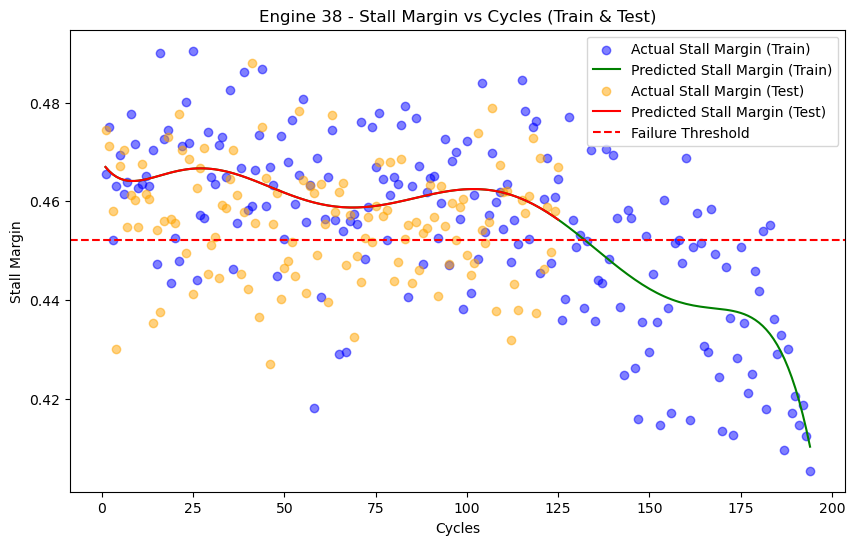

Engine 38 - R2 score (Train): 0.48862381929932963
Training: Stall margin breaches the threshold at cycle 140, predicted value 0.4474740046600076
Remaining useful life (Train): 54
mse train: 0.00017511637069202757
mse_test: 0.0004886107877263544


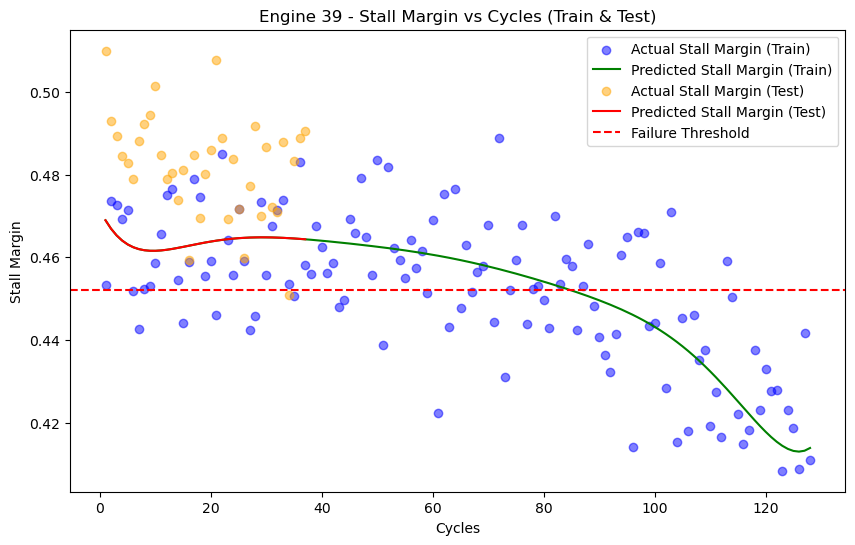

Engine 39 - R2 score (Train): 0.47524179109381126
Training: Stall margin breaches the threshold at cycle 94, predicted value 0.44737304151879065
Remaining useful life (Train): 34
mse train: 0.00011659016499806632
mse_test: 0.00018378959591211722


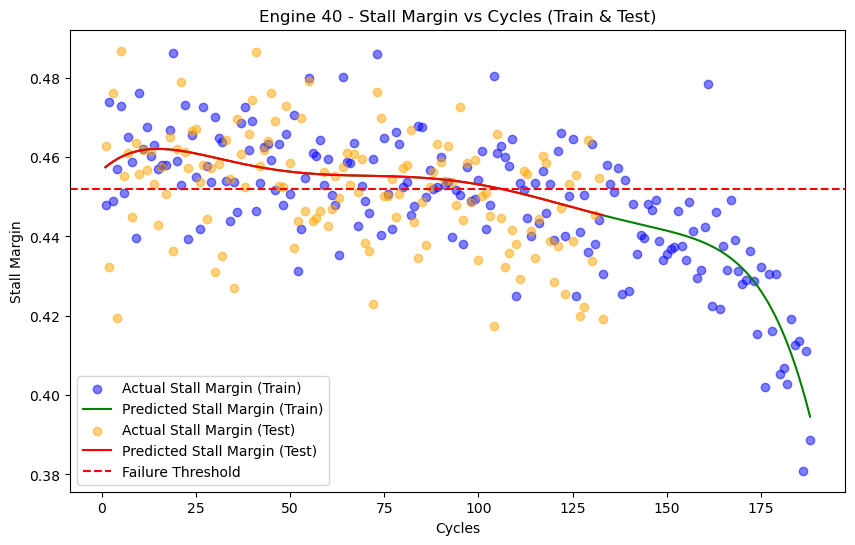

Engine 40 - R2 score (Train): 0.6083069113701436
Training: Stall margin breaches the threshold at cycle 125, predicted value 0.4473642996553841
Remaining useful life (Train): 63
Test: Stall margin breaches the threshold at cycle 106, predicted value 0.45199560570014147
Remaining useful life (Test): 27
mse train: 0.00014648241484451193
mse_test: 0.0002781687510376439


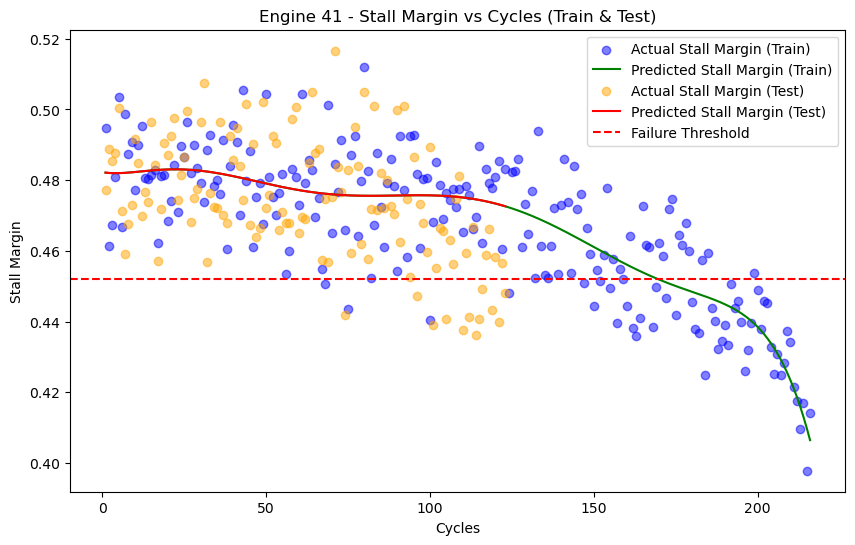

Engine 41 - R2 score (Train): 0.6606009523809675
Training: Stall margin breaches the threshold at cycle 183, predicted value 0.44745373998313026
Remaining useful life (Train): 33
mse train: 0.00015116680612250989
mse_test: 0.00022032617360015676


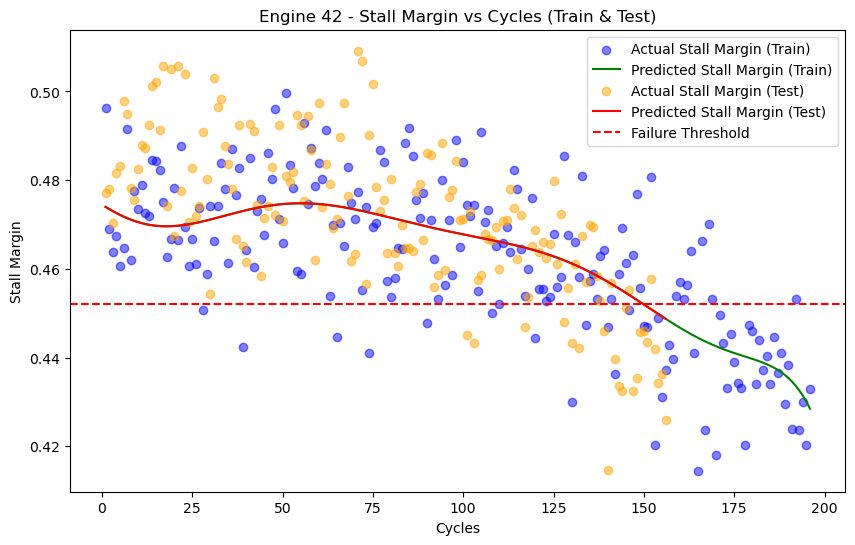

Engine 42 - R2 score (Train): 0.5288389840252952
Training: Stall margin breaches the threshold at cycle 159, predicted value 0.4472113646443549
Remaining useful life (Train): 37
Test: Stall margin breaches the threshold at cycle 150, predicted value 0.4519598282750312
Remaining useful life (Test): 6
mse train: 0.00015081911322929783
mse_test: 0.00027911874112751365


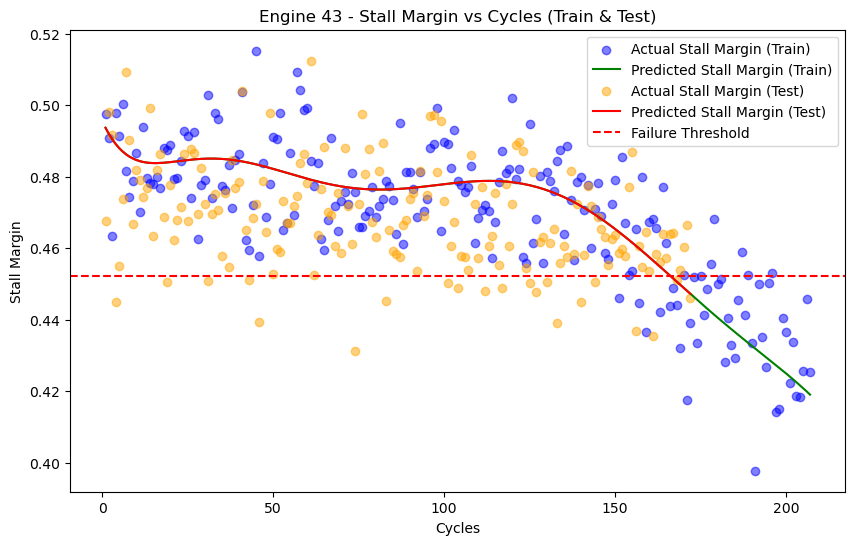

Engine 43 - R2 score (Train): 0.6464642618431171
Training: Stall margin breaches the threshold at cycle 172, predicted value 0.44723760903128384
Remaining useful life (Train): 35
Test: Stall margin breaches the threshold at cycle 167, predicted value 0.4515205603862643
Remaining useful life (Test): 5
mse train: 0.0001432410323049259
mse_test: 0.0002746365474330921


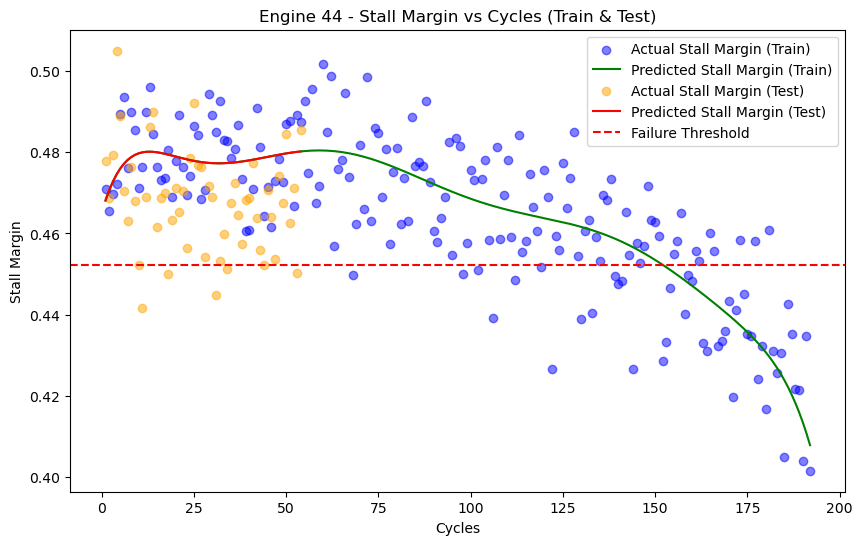

Engine 44 - R2 score (Train): 0.6487665668417232
Training: Stall margin breaches the threshold at cycle 160, predicted value 0.4471008931371839
Remaining useful life (Train): 32
mse train: 0.00013805408379112674
mse_test: 0.0003222106635961274


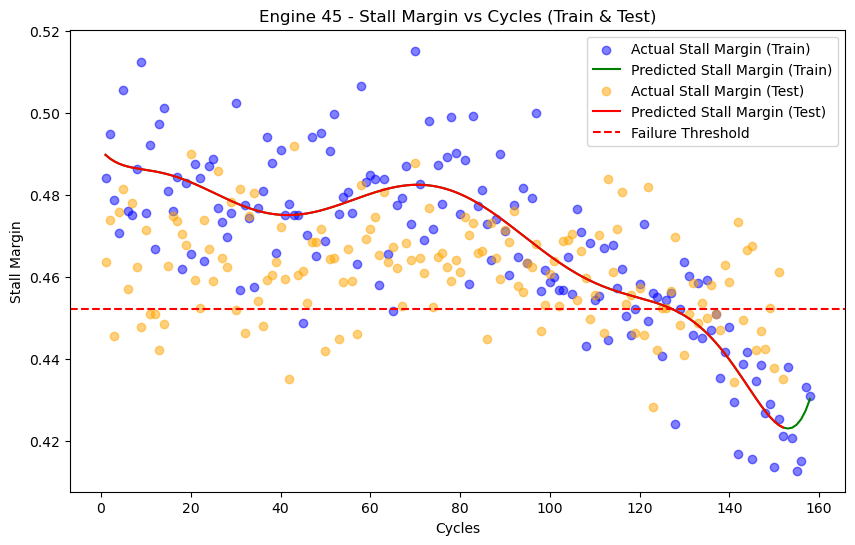

Engine 45 - R2 score (Train): 0.7059350611948305
Training: Stall margin breaches the threshold at cycle 134, predicted value 0.44721589183532817
Remaining useful life (Train): 24
Test: Stall margin breaches the threshold at cycle 128, predicted value 0.45169866776191814
Remaining useful life (Test): 24
mse train: 0.00017145535646043999
mse_test: 0.0005237394027170809


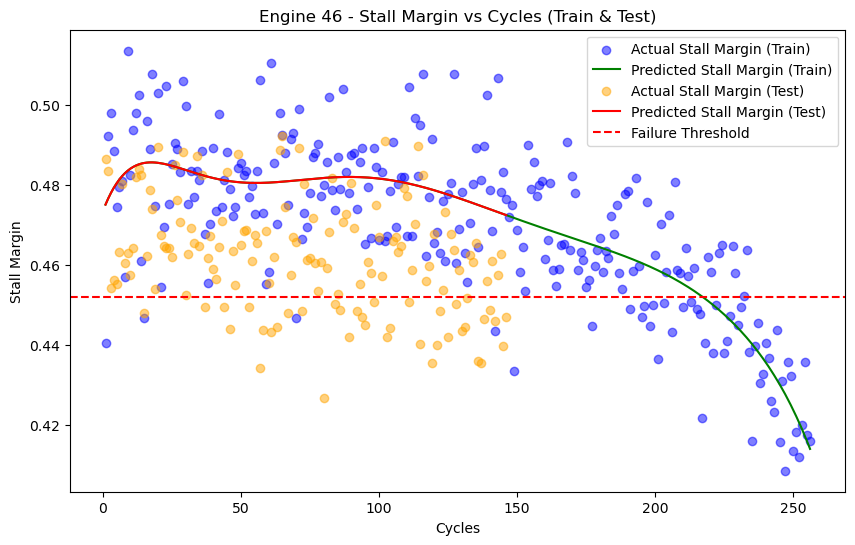

Engine 46 - R2 score (Train): 0.6139858751898559
Training: Stall margin breaches the threshold at cycle 226, predicted value 0.44696338985862816
Remaining useful life (Train): 30
mse train: 0.00015098381887651167
mse_test: 0.0006415049503004365


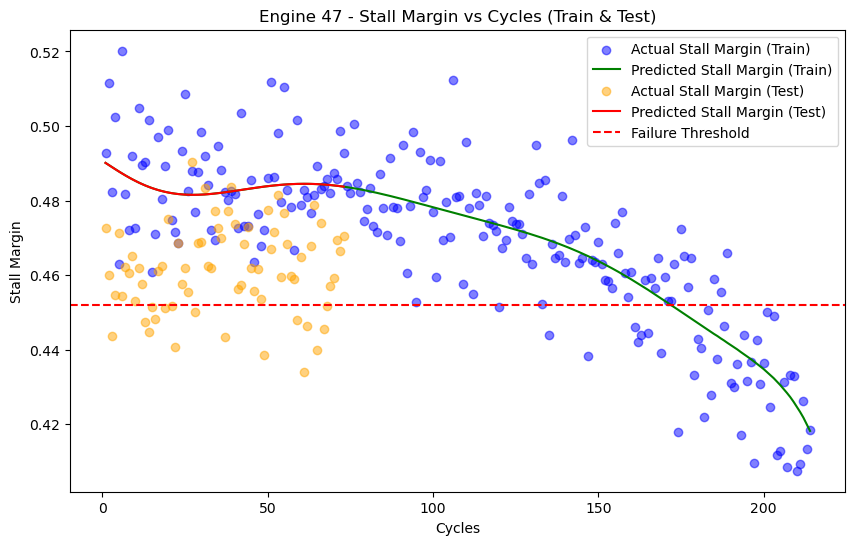

Engine 47 - R2 score (Train): 0.7114888016873586
Training: Stall margin breaches the threshold at cycle 180, predicted value 0.44717182344640594
Remaining useful life (Train): 34
mse train: 0.0001592687436628634
mse_test: 0.00034963409825285397


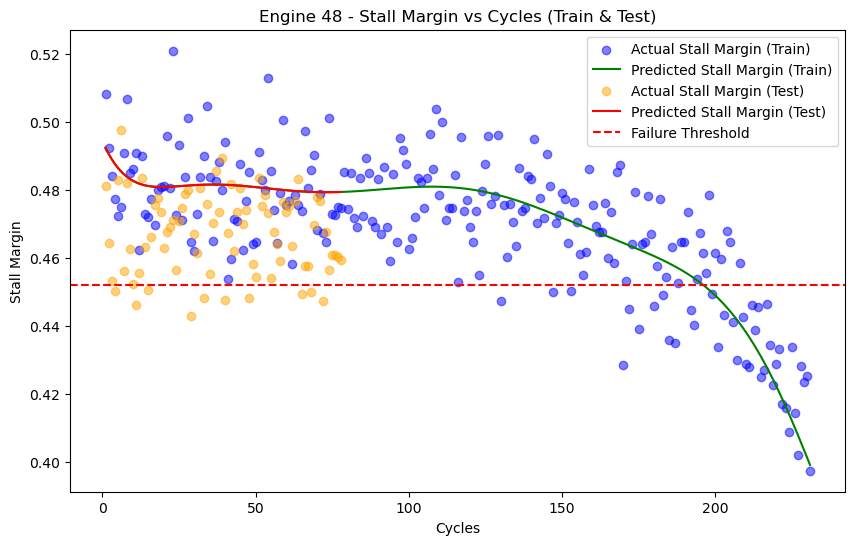

Engine 48 - R2 score (Train): 0.6324702823783273
Training: Stall margin breaches the threshold at cycle 202, predicted value 0.44715164217447656
Remaining useful life (Train): 29
mse train: 0.00016495324600622824
mse_test: 0.31283346264439404


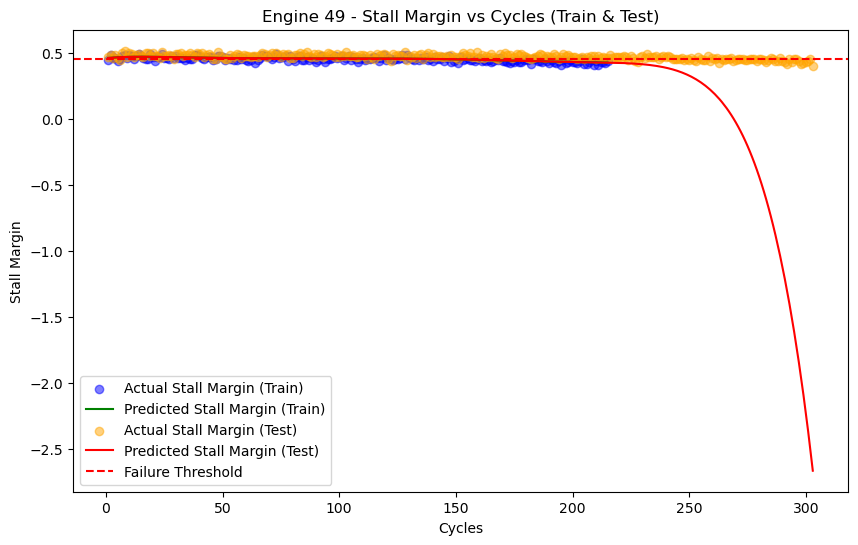

Engine 49 - R2 score (Train): 0.4400669017495028
Training: Stall margin breaches the threshold at cycle 162, predicted value 0.44745713491922423
Remaining useful life (Train): 53
Test: Stall margin breaches the threshold at cycle 150, predicted value 0.45199447889810607
Remaining useful life (Test): 153
mse train: 0.00015040805898133548
mse_test: 0.00017022049516308077


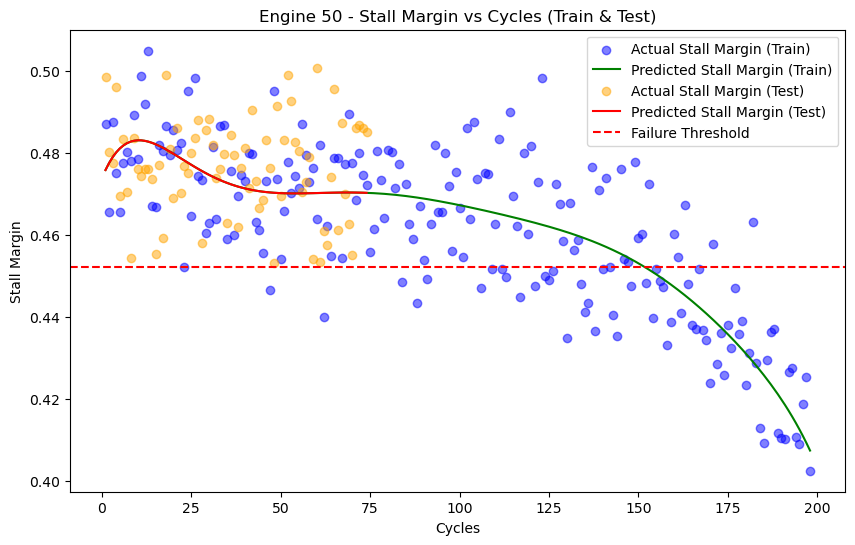

Engine 50 - R2 score (Train): 0.6500273424989396
Training: Stall margin breaches the threshold at cycle 160, predicted value 0.4472906718621018
Remaining useful life (Train): 38
mse train: 0.00015985595961837332
mse_test: 0.00022463195825721532


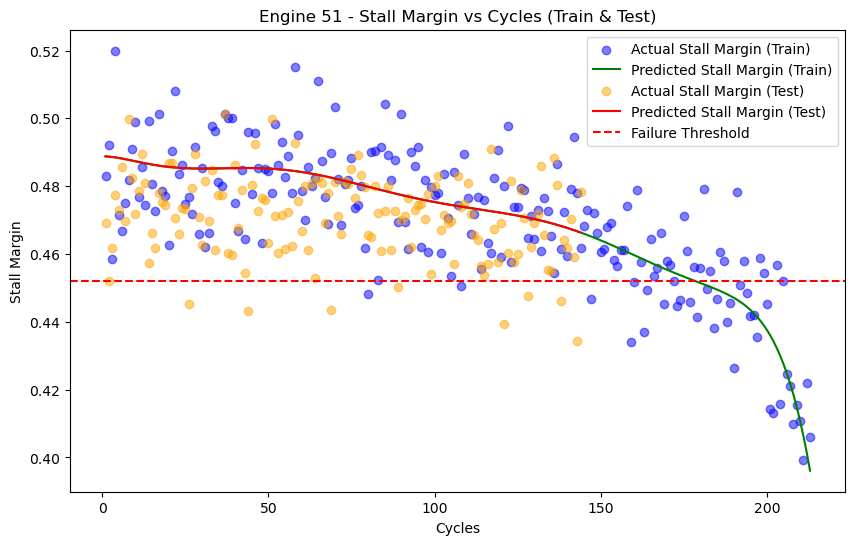

Engine 51 - R2 score (Train): 0.6434677547901971
Training: Stall margin breaches the threshold at cycle 190, predicted value 0.44711784587727804
Remaining useful life (Train): 23
mse train: 0.0001490543167980529
mse_test: 0.0005790691999267783


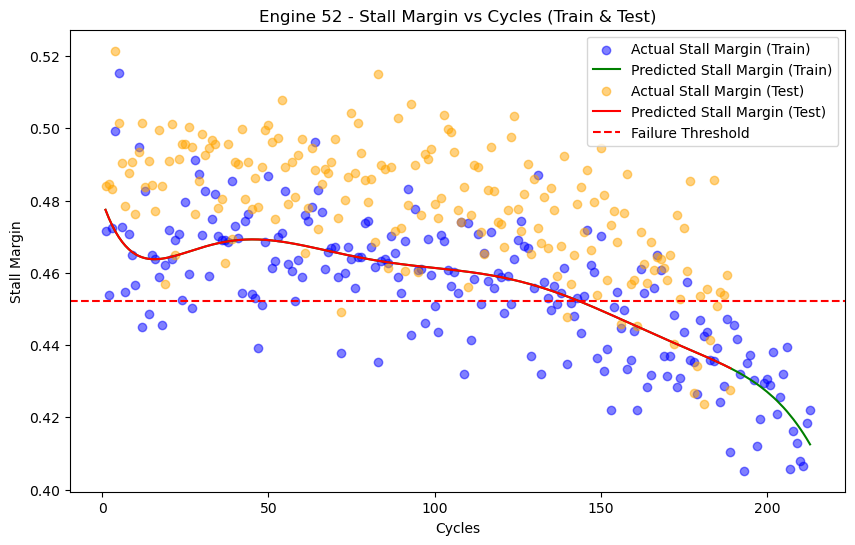

Engine 52 - R2 score (Train): 0.596001457957531
Training: Stall margin breaches the threshold at cycle 156, predicted value 0.4471875074818718
Remaining useful life (Train): 57
Test: Stall margin breaches the threshold at cycle 144, predicted value 0.4519892576649773
Remaining useful life (Test): 45
mse train: 0.0001234774894973817
mse_test: 0.00021195076058260913


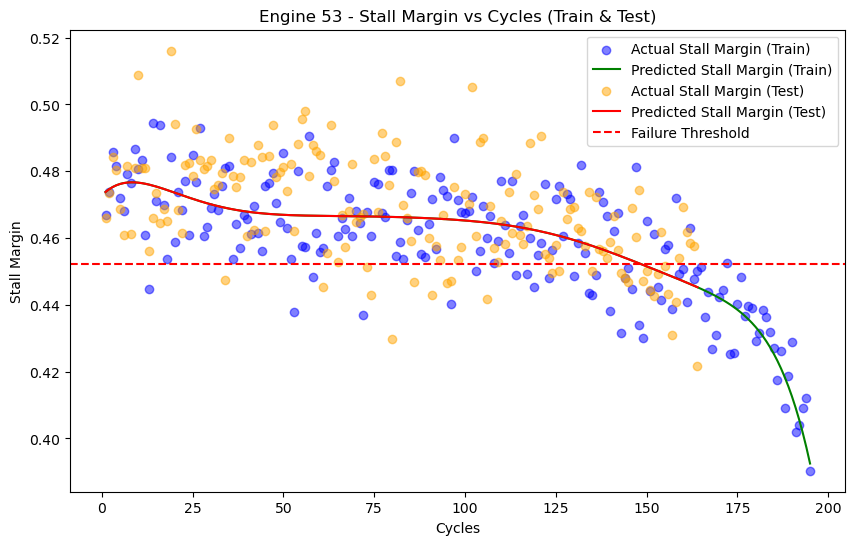

Engine 53 - R2 score (Train): 0.651487440843542
Training: Stall margin breaches the threshold at cycle 160, predicted value 0.4471389991163241
Remaining useful life (Train): 35
Test: Stall margin breaches the threshold at cycle 149, predicted value 0.4519731332479941
Remaining useful life (Test): 15
mse train: 0.00017611212566855667
mse_test: 0.0002071102708591232


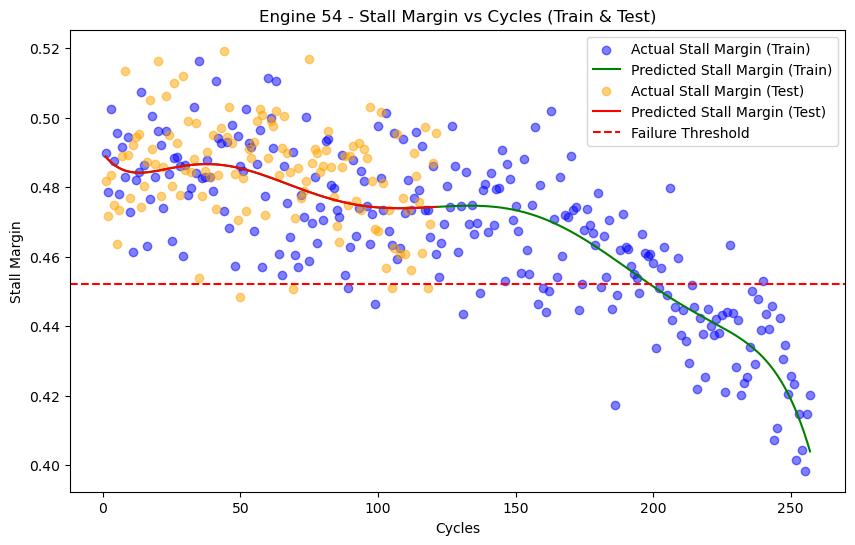

Engine 54 - R2 score (Train): 0.6667773296595205
Training: Stall margin breaches the threshold at cycle 208, predicted value 0.44728710277903583
Remaining useful life (Train): 49
mse train: 0.00014803219232159044
mse_test: 0.00016673018801858486


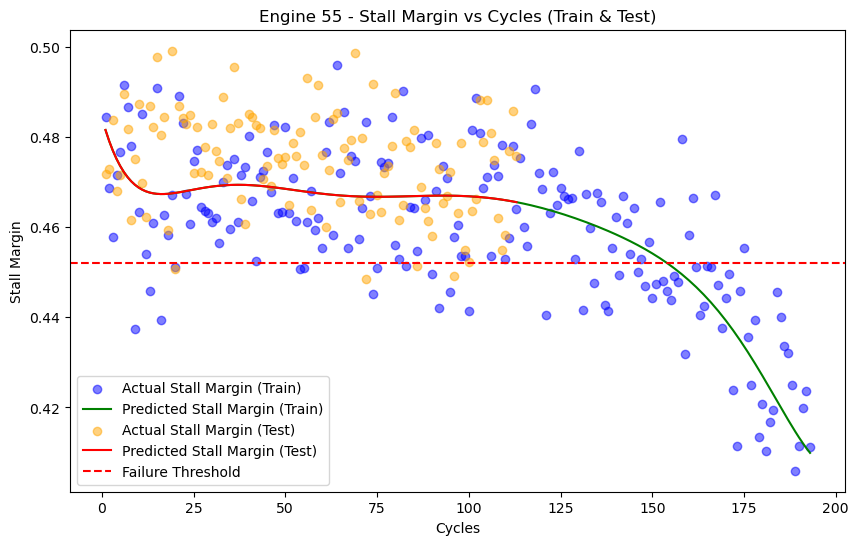

Engine 55 - R2 score (Train): 0.5426172211298634
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.4474731608782822
Remaining useful life (Train): 32
mse train: 0.00014896748485692808
mse_test: 0.0002802069411385239


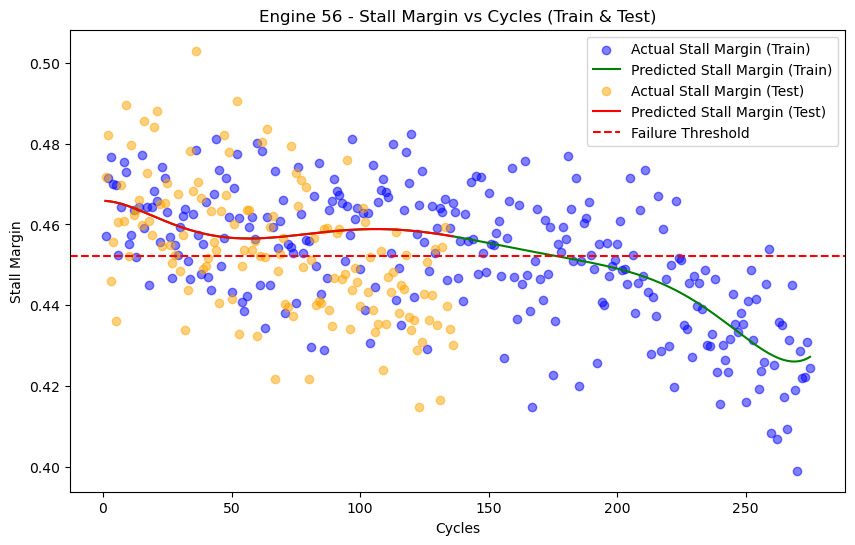

Engine 56 - R2 score (Train): 0.43720492876437267
Training: Stall margin breaches the threshold at cycle 209, predicted value 0.44740068508721603
Remaining useful life (Train): 66
mse train: 0.00013680833486812884
mse_test: 0.0039821762633801385


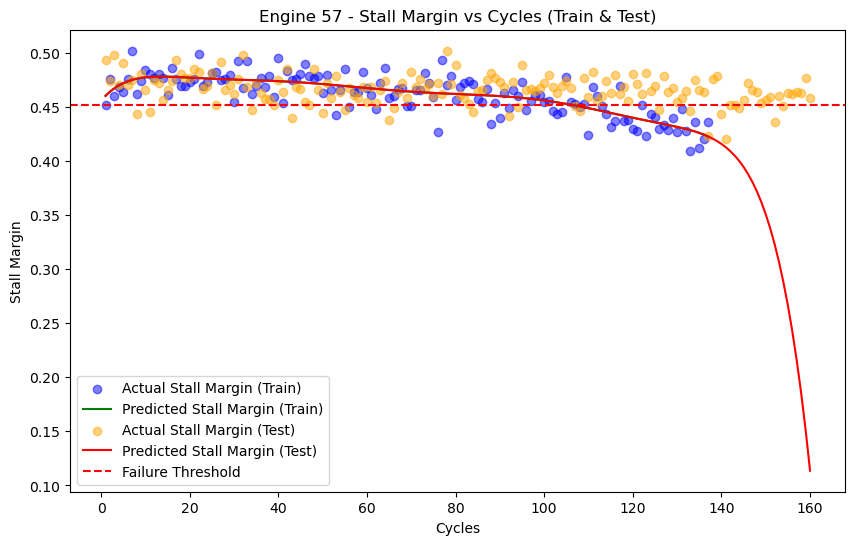

Engine 57 - R2 score (Train): 0.6130013355006521
Training: Stall margin breaches the threshold at cycle 112, predicted value 0.4470134794536027
Remaining useful life (Train): 25
Test: Stall margin breaches the threshold at cycle 106, predicted value 0.4519422545853051
Remaining useful life (Test): 54
mse train: 0.00014728501583969545
mse_test: 0.004642483033907266


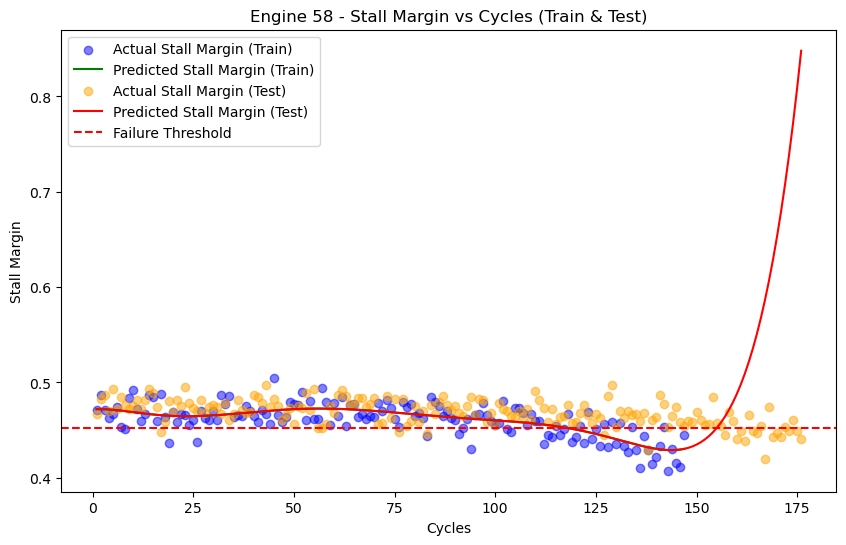

Engine 58 - R2 score (Train): 0.546955770120976
Training: Stall margin breaches the threshold at cycle 124, predicted value 0.4470556114405777
Remaining useful life (Train): 23
Test: Stall margin breaches the threshold at cycle 119, predicted value 0.4514624845773365
Remaining useful life (Test): 57
mse train: 0.00016151136204814112
mse_test: 0.00019930673840766122


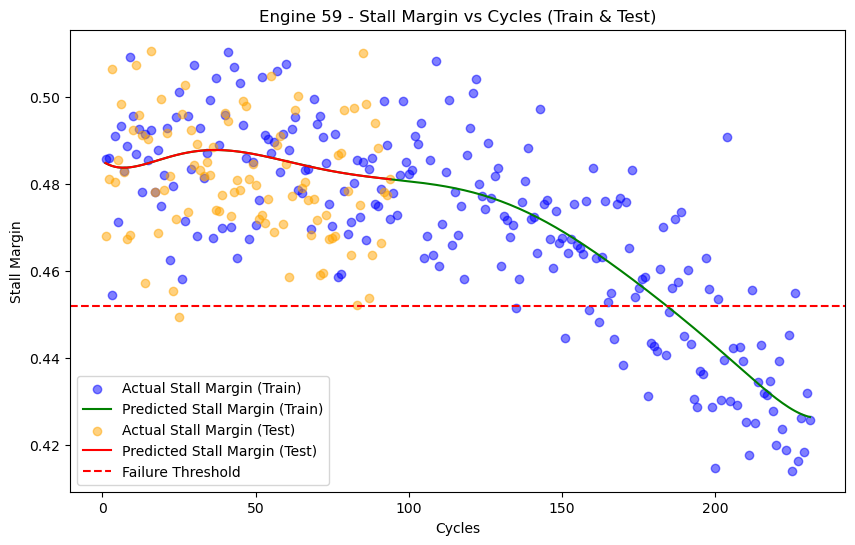

Engine 59 - R2 score (Train): 0.6796627121137753
Training: Stall margin breaches the threshold at cycle 193, predicted value 0.44697670509262327
Remaining useful life (Train): 38
mse train: 0.000139680583733614
mse_test: 0.00020812149814131294


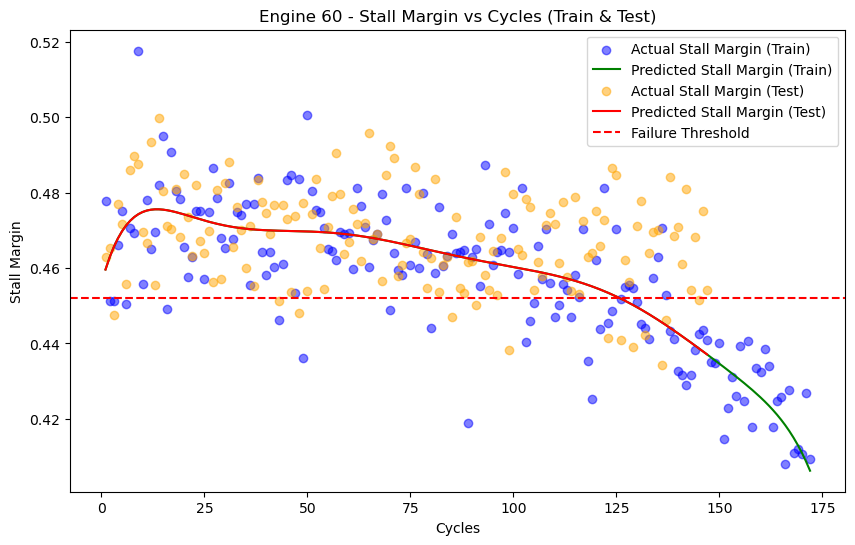

Engine 60 - R2 score (Train): 0.6395354124290415
Training: Stall margin breaches the threshold at cycle 134, predicted value 0.44699883818118974
Remaining useful life (Train): 38
Test: Stall margin breaches the threshold at cycle 126, predicted value 0.45189882799475595
Remaining useful life (Test): 21
mse train: 0.00017600354949709563
mse_test: 0.00023114431675040563


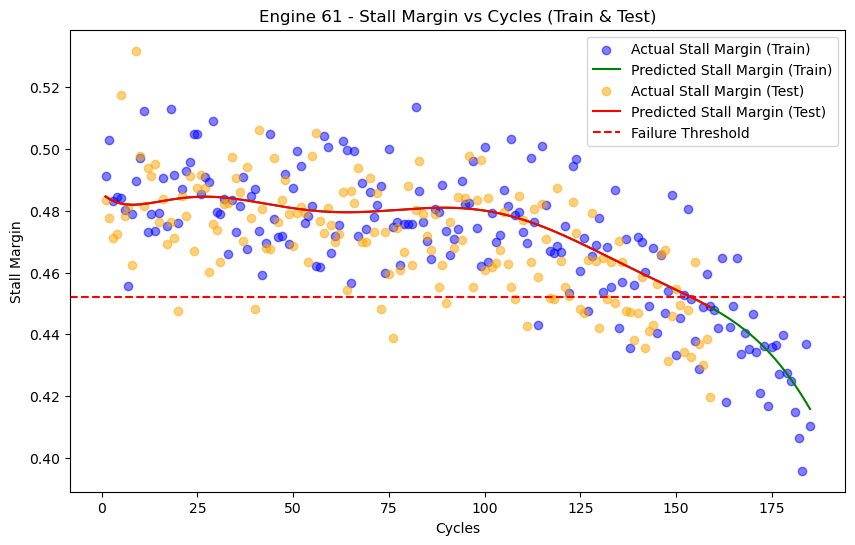

Engine 61 - R2 score (Train): 0.6580639543848874
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.44730580704301043
Remaining useful life (Train): 24
Test: Stall margin breaches the threshold at cycle 154, predicted value 0.4519913281688039
Remaining useful life (Test): 5
mse train: 0.0001602201822014456
mse_test: 0.03330491731484085


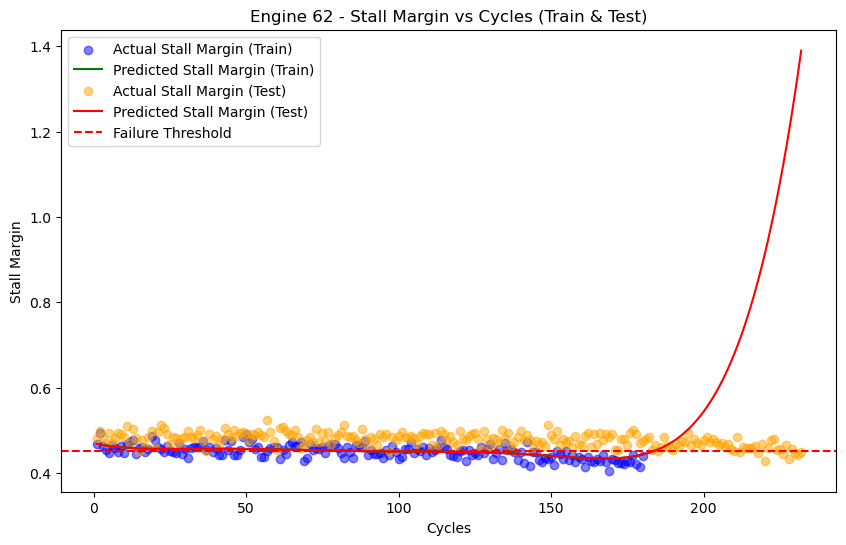

Engine 62 - R2 score (Train): 0.38339539012340706
Training: Stall margin breaches the threshold at cycle 131, predicted value 0.4474083833670866
Remaining useful life (Train): 49
Test: Stall margin breaches the threshold at cycle 80, predicted value 0.4519860275364172
Remaining useful life (Test): 152
mse train: 0.00017430339511432302
mse_test: 0.0002336316498946676


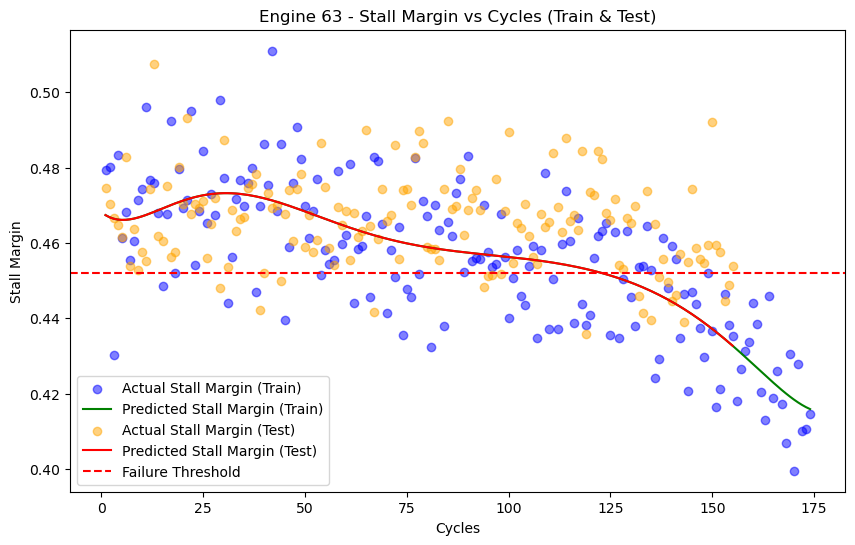

Engine 63 - R2 score (Train): 0.5709530823950513
Training: Stall margin breaches the threshold at cycle 135, predicted value 0.44722428299194944
Remaining useful life (Train): 39
Test: Stall margin breaches the threshold at cycle 123, predicted value 0.4519792807818092
Remaining useful life (Test): 32
mse train: 0.00014124522675554977
mse_test: 0.0002043835741474219


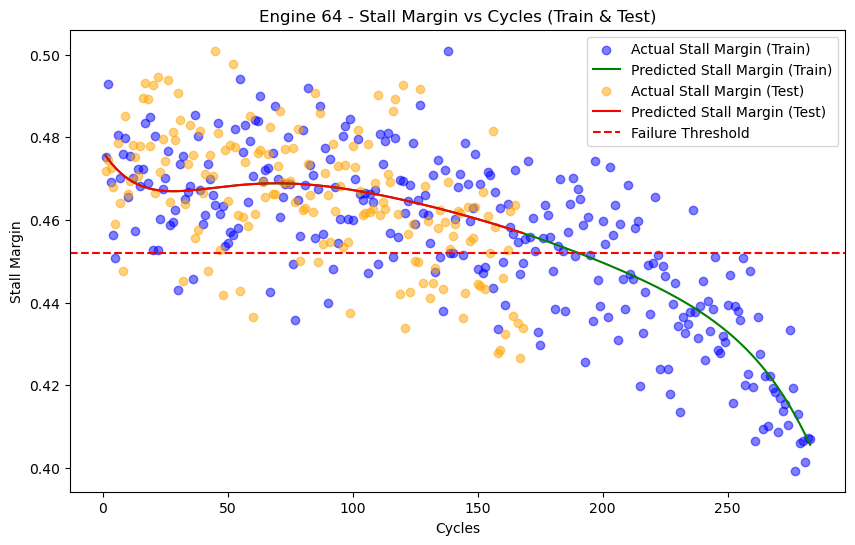

Engine 64 - R2 score (Train): 0.6588065785933186
Training: Stall margin breaches the threshold at cycle 209, predicted value 0.4473651382314236
Remaining useful life (Train): 74
mse train: 0.00014740951526671863
mse_test: 0.00017975262986698378


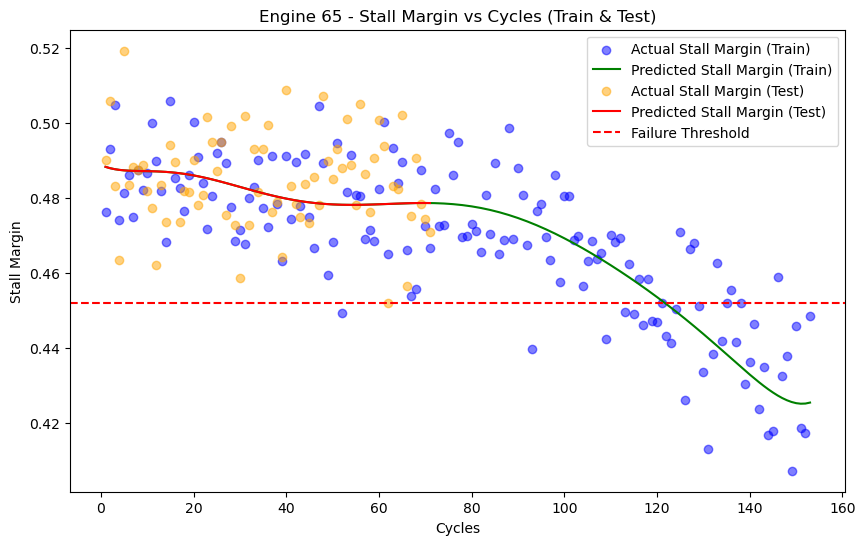

Engine 65 - R2 score (Train): 0.6550946673027731
Training: Stall margin breaches the threshold at cycle 127, predicted value 0.446800458768229
Remaining useful life (Train): 26
mse train: 0.00013693703126753257
mse_test: 0.0001967241963110622


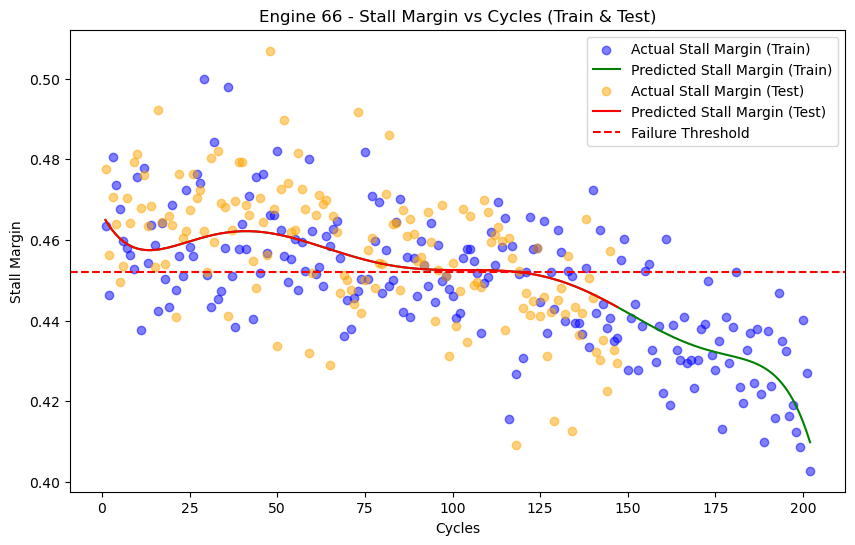

Engine 66 - R2 score (Train): 0.4985487734005358
Training: Stall margin breaches the threshold at cycle 138, predicted value 0.44735458333004124
Remaining useful life (Train): 64
Test: Stall margin breaches the threshold at cycle 119, predicted value 0.45200292233336575
Remaining useful life (Test): 28
mse train: 0.0001609971721217661
mse_test: 0.00020126375351187432


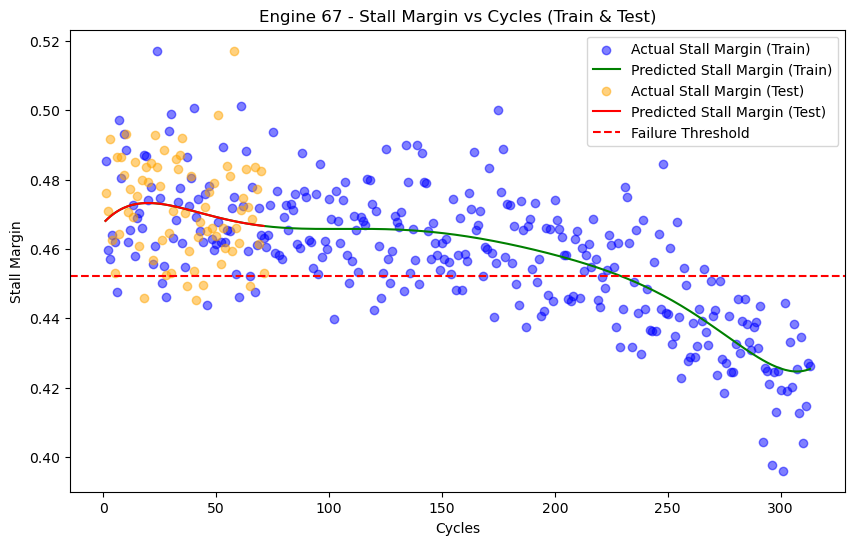

Engine 67 - R2 score (Train): 0.5683610131064869
Training: Stall margin breaches the threshold at cycle 246, predicted value 0.4472518134133523
Remaining useful life (Train): 67
mse train: 0.00013351698347821654
mse_test: 0.00025556826675638675


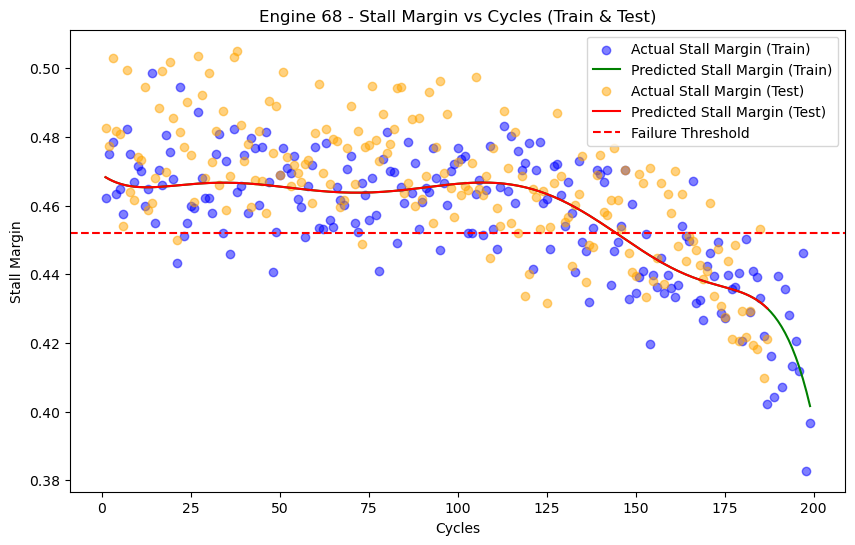

Engine 68 - R2 score (Train): 0.6276186305402024
Training: Stall margin breaches the threshold at cycle 151, predicted value 0.44745017158282735
Remaining useful life (Train): 48
Test: Stall margin breaches the threshold at cycle 145, predicted value 0.4516341047216747
Remaining useful life (Test): 42
mse train: 0.0001868662946607253
mse_test: 0.00018326067619601916


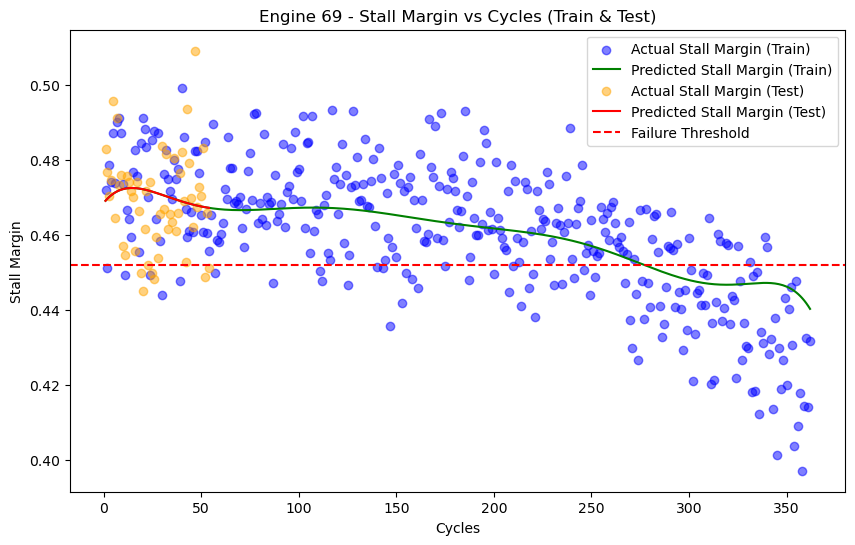

Engine 69 - R2 score (Train): 0.44567762129008803
Training: Stall margin breaches the threshold at cycle 305, predicted value 0.4475048628637406
Remaining useful life (Train): 57
mse train: 0.00014335443113454942
mse_test: 0.0038069574563622554


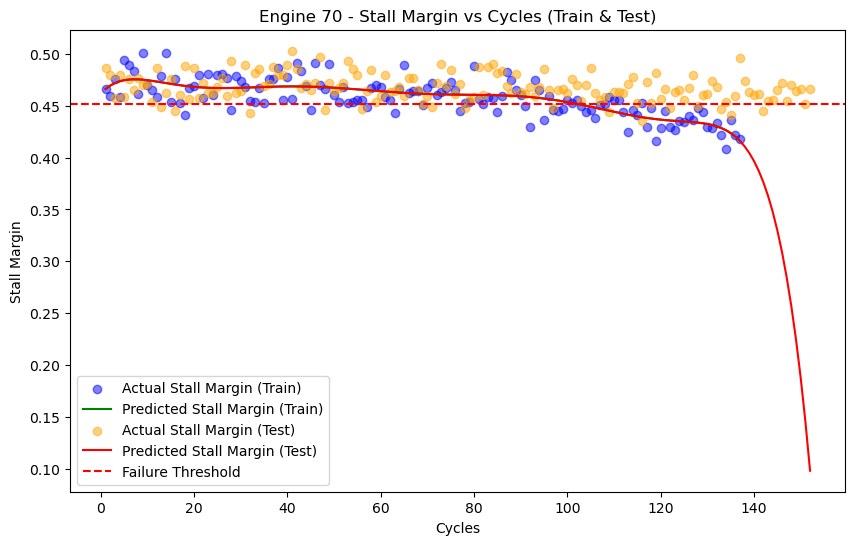

Engine 70 - R2 score (Train): 0.5625761330056789
Training: Stall margin breaches the threshold at cycle 107, predicted value 0.4471150357745931
Remaining useful life (Train): 30
Test: Stall margin breaches the threshold at cycle 102, predicted value 0.45187303614843344
Remaining useful life (Test): 50
mse train: 0.00014211881093476272
mse_test: 0.0002593110079619943


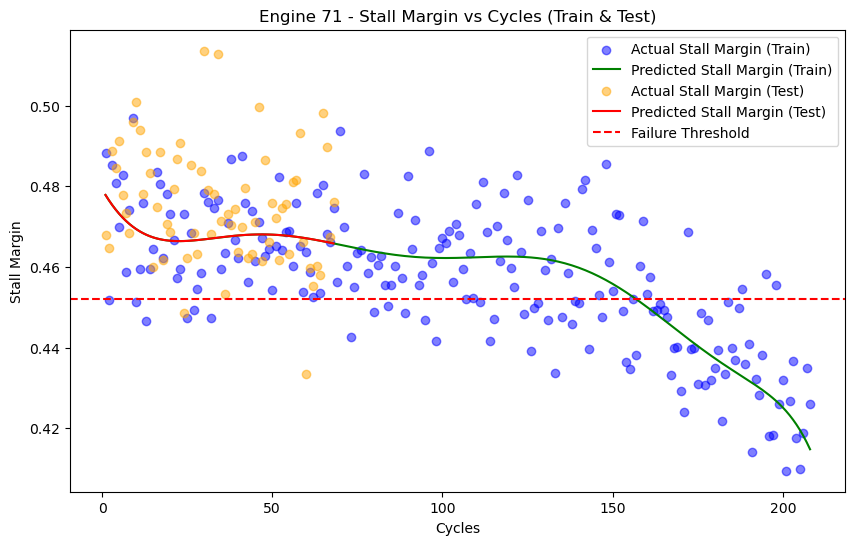

Engine 71 - R2 score (Train): 0.5169674882889198
Training: Stall margin breaches the threshold at cycle 165, predicted value 0.4468805116967888
Remaining useful life (Train): 43
mse train: 0.00014004850741516654
mse_test: 0.00016977585679116072


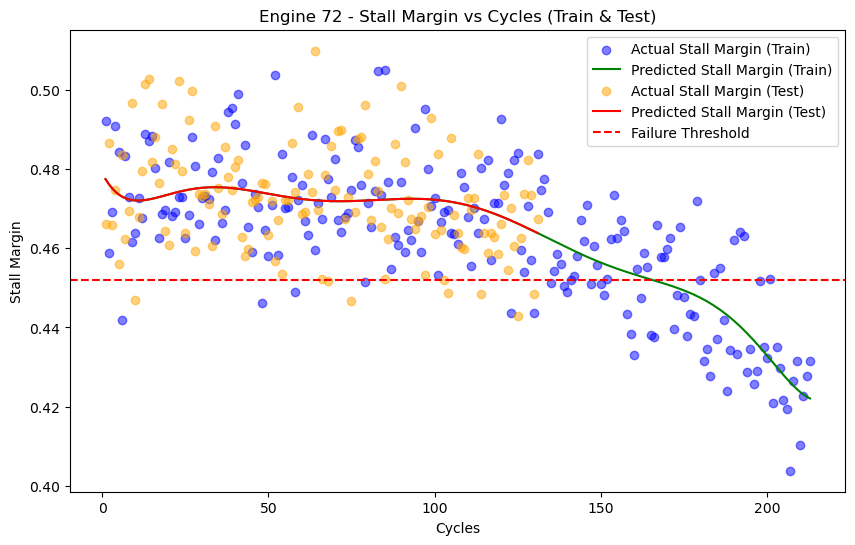

Engine 72 - R2 score (Train): 0.596336461902651
Training: Stall margin breaches the threshold at cycle 180, predicted value 0.4474962045344486
Remaining useful life (Train): 33
mse train: 0.00014760553432972528
mse_test: 0.0007409549072147165


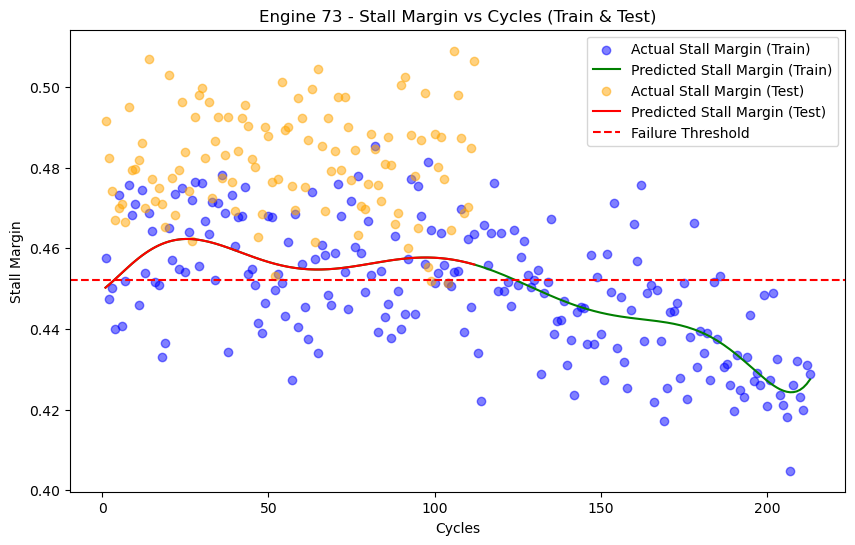

Engine 73 - R2 score (Train): 0.4247304237993771
Training: Stall margin breaches the threshold at cycle 138, predicted value 0.447225632637984
Remaining useful life (Train): 75
Test: Stall margin breaches the threshold at cycle 1, predicted value 0.45026616610860776
Remaining useful life (Test): 111
mse train: 0.000199256898555273
mse_test: 0.0002309912337913049


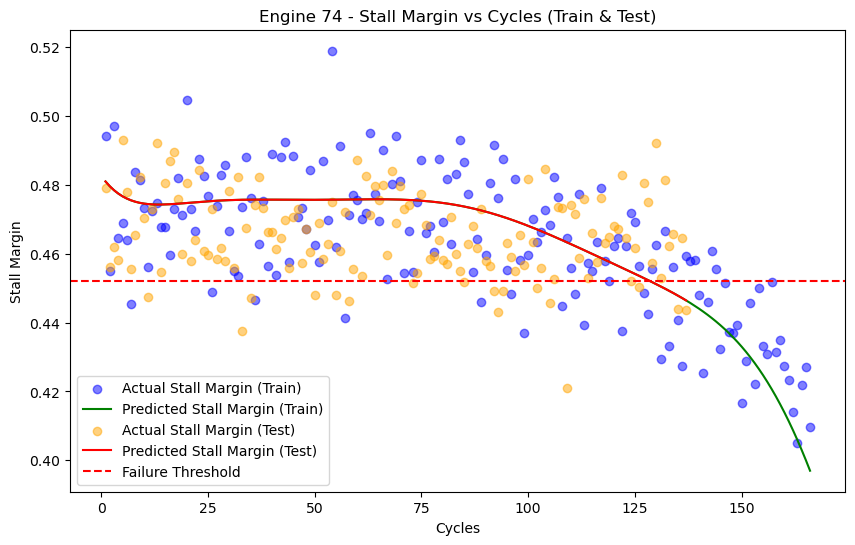

Engine 74 - R2 score (Train): 0.5089523811645575
Training: Stall margin breaches the threshold at cycle 136, predicted value 0.44716561424487883
Remaining useful life (Train): 30
Test: Stall margin breaches the threshold at cycle 129, predicted value 0.4517720996117001
Remaining useful life (Test): 8
mse train: 0.00016543022100798846
mse_test: 0.00028712416625941675


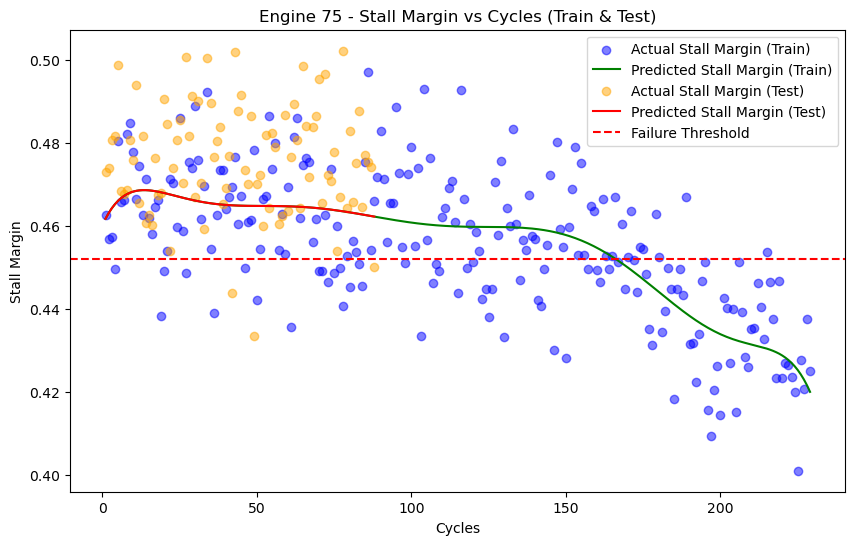

Engine 75 - R2 score (Train): 0.46988366015748095
Training: Stall margin breaches the threshold at cycle 175, predicted value 0.44723524491268063
Remaining useful life (Train): 54
mse train: 0.00015704133036928948
mse_test: 0.0005109012783751274


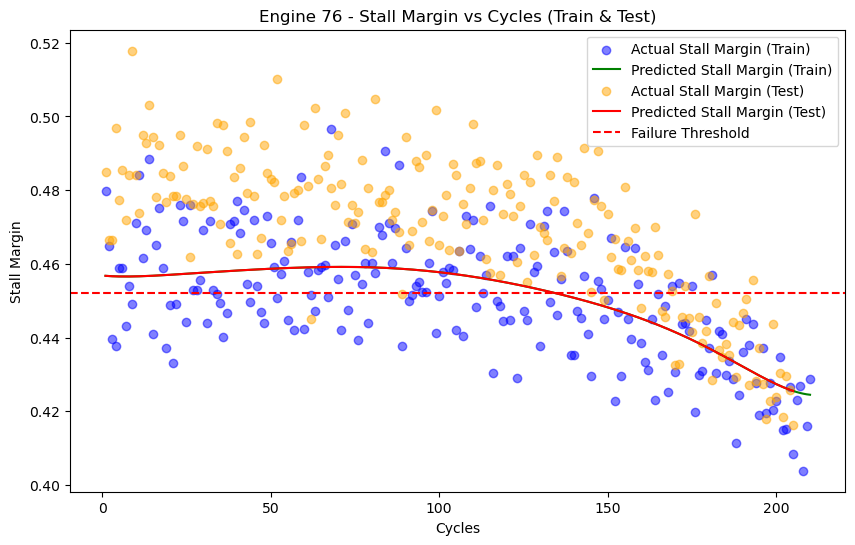

Engine 76 - R2 score (Train): 0.44744946456953316
Training: Stall margin breaches the threshold at cycle 153, predicted value 0.44735216572801745
Remaining useful life (Train): 57
Test: Stall margin breaches the threshold at cycle 135, predicted value 0.4519565835587231
Remaining useful life (Test): 70
mse train: 0.00017707983265644706
mse_test: 0.0005330791557570967


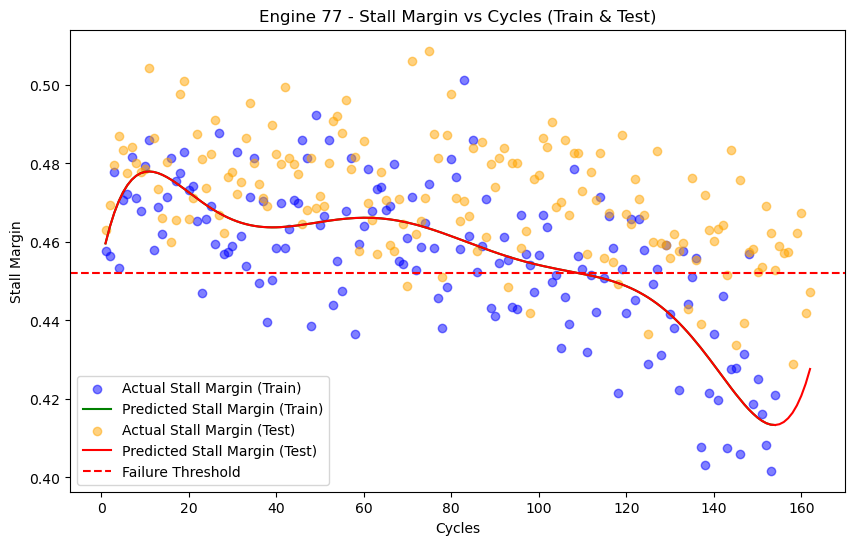

Engine 77 - R2 score (Train): 0.535429421554865
Training: Stall margin breaches the threshold at cycle 123, predicted value 0.4471407709119835
Remaining useful life (Train): 31
Test: Stall margin breaches the threshold at cycle 109, predicted value 0.4520906982420006
Remaining useful life (Test): 53
mse train: 0.00016468913981768763
mse_test: 0.00018401709353152852


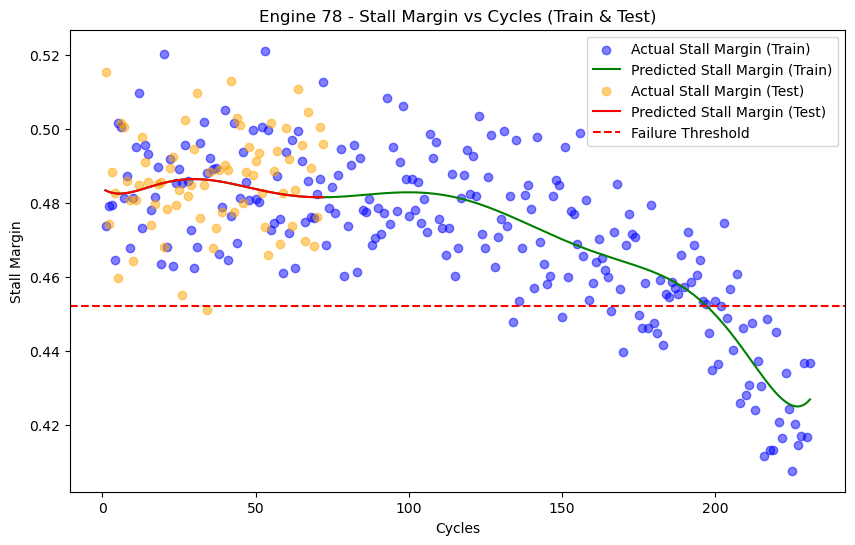

Engine 78 - R2 score (Train): 0.6624747426441024
Training: Stall margin breaches the threshold at cycle 203, predicted value 0.4469831524115363
Remaining useful life (Train): 28
mse train: 0.000158354063738575
mse_test: 0.0002921493371943172


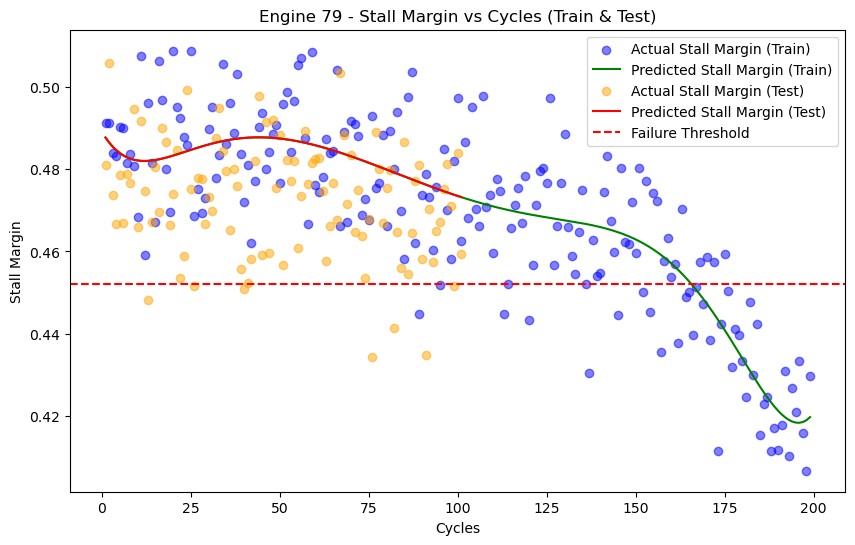

Engine 79 - R2 score (Train): 0.7036576894776368
Training: Stall margin breaches the threshold at cycle 170, predicted value 0.44730707525916735
Remaining useful life (Train): 29
mse train: 0.00015869247647816795
mse_test: 0.00024054950920322042


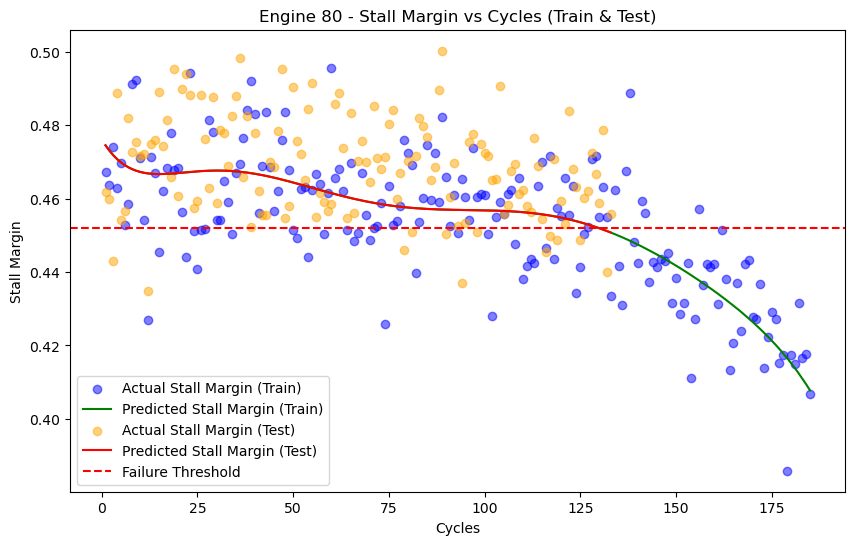

Engine 80 - R2 score (Train): 0.544618649738976
Training: Stall margin breaches the threshold at cycle 140, predicted value 0.44749823668276345
Remaining useful life (Train): 45
Test: Stall margin breaches the threshold at cycle 130, predicted value 0.4519083843496946
Remaining useful life (Test): 3
mse train: 0.00016646365992915418
mse_test: 0.00022522594144215949


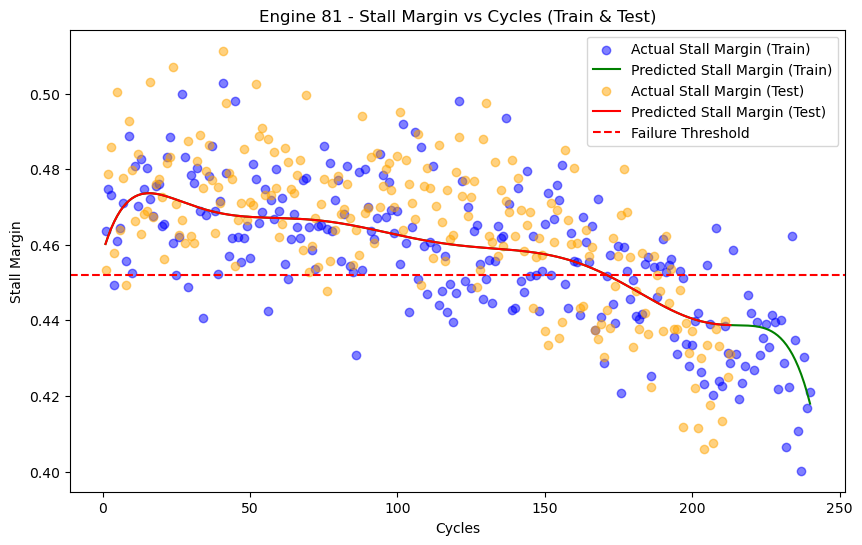

Engine 81 - R2 score (Train): 0.5216574418688915
Training: Stall margin breaches the threshold at cycle 182, predicted value 0.4473626598419545
Remaining useful life (Train): 58
Test: Stall margin breaches the threshold at cycle 171, predicted value 0.4520146831573842
Remaining useful life (Test): 42
mse train: 0.00018702446928094187
mse_test: 0.0003645504949724934


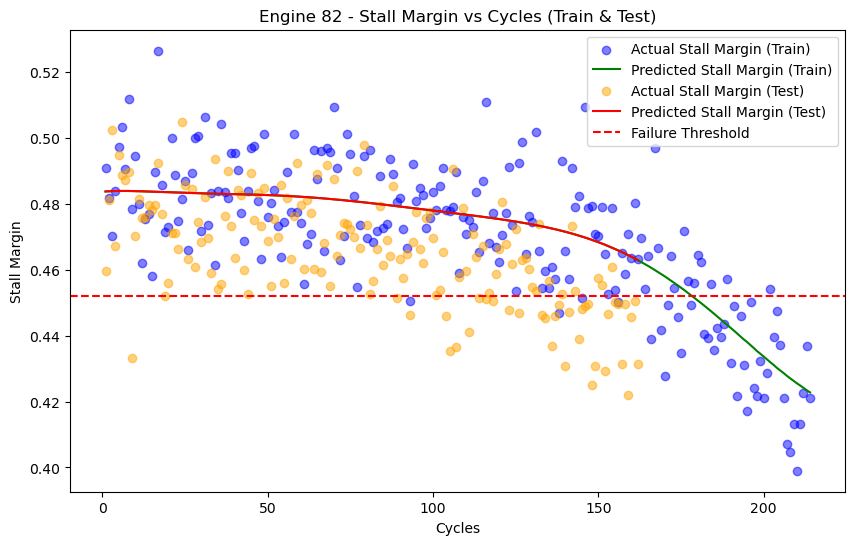

Engine 82 - R2 score (Train): 0.6439214283579313
Training: Stall margin breaches the threshold at cycle 184, predicted value 0.4474759989721923
Remaining useful life (Train): 30
mse train: 0.00015042861674222668
mse_test: 0.0003957807582428684


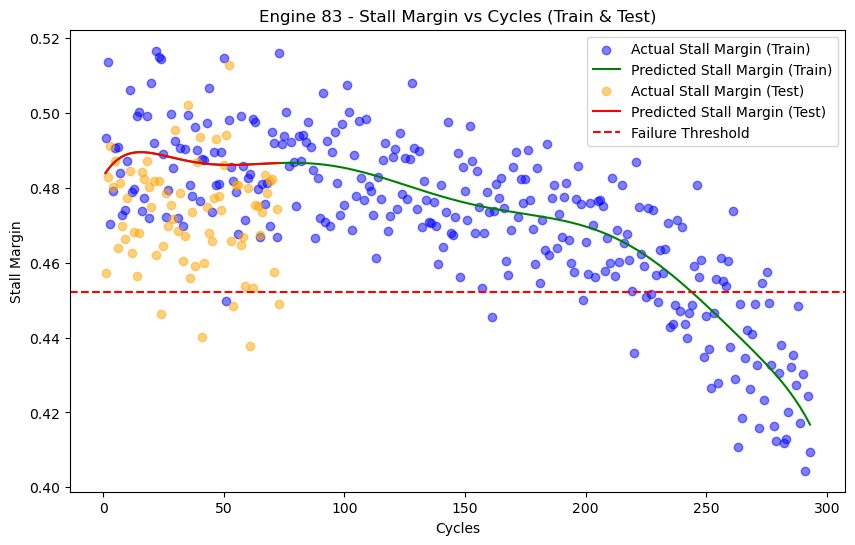

Engine 83 - R2 score (Train): 0.6929191666586891
Training: Stall margin breaches the threshold at cycle 252, predicted value 0.447402208612018
Remaining useful life (Train): 41
mse train: 0.0001547570383563474
mse_test: 0.00022443434208464585


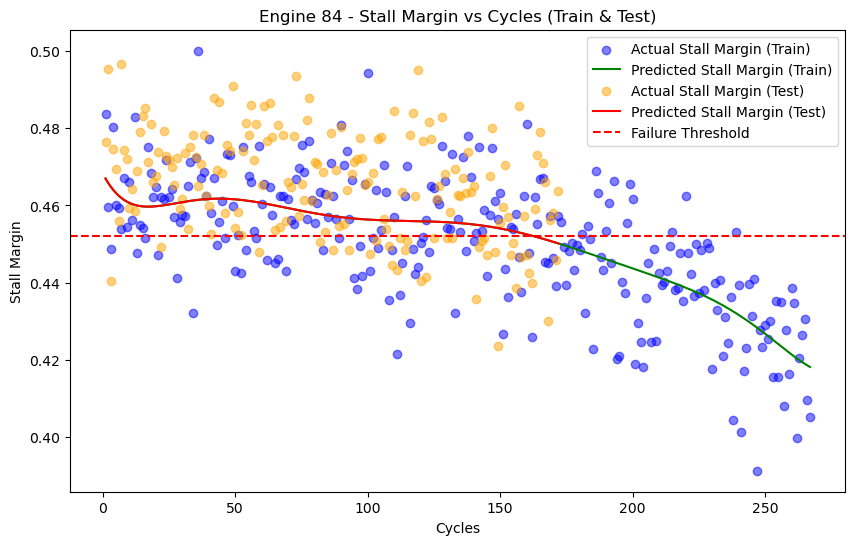

Engine 84 - R2 score (Train): 0.48638546754200795
Training: Stall margin breaches the threshold at cycle 184, predicted value 0.4474769613401576
Remaining useful life (Train): 83
Test: Stall margin breaches the threshold at cycle 163, predicted value 0.4519946842150374
Remaining useful life (Test): 9
mse train: 0.0001565785081139079
mse_test: 0.00019709147224485153


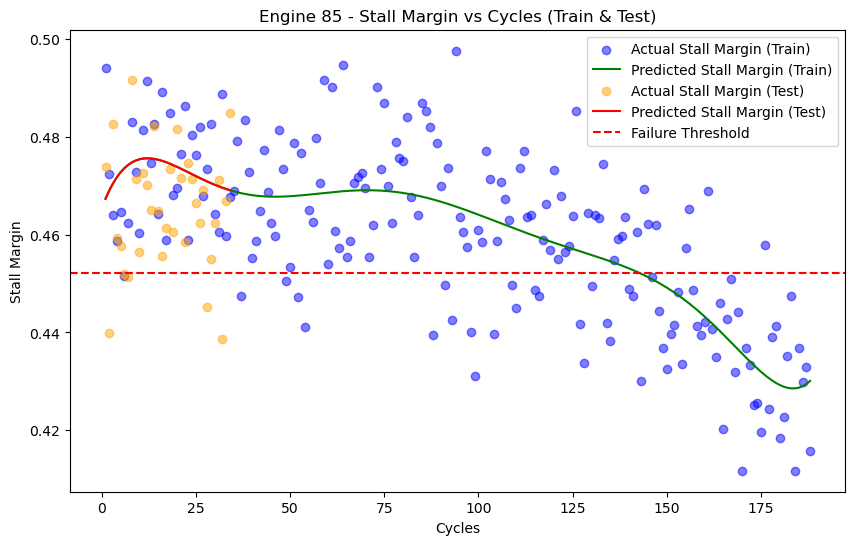

Engine 85 - R2 score (Train): 0.5278051548503413
Training: Stall margin breaches the threshold at cycle 154, predicted value 0.447064819154514
Remaining useful life (Train): 34
mse train: 0.00015529609159646576
mse_test: 0.00022603941877454885


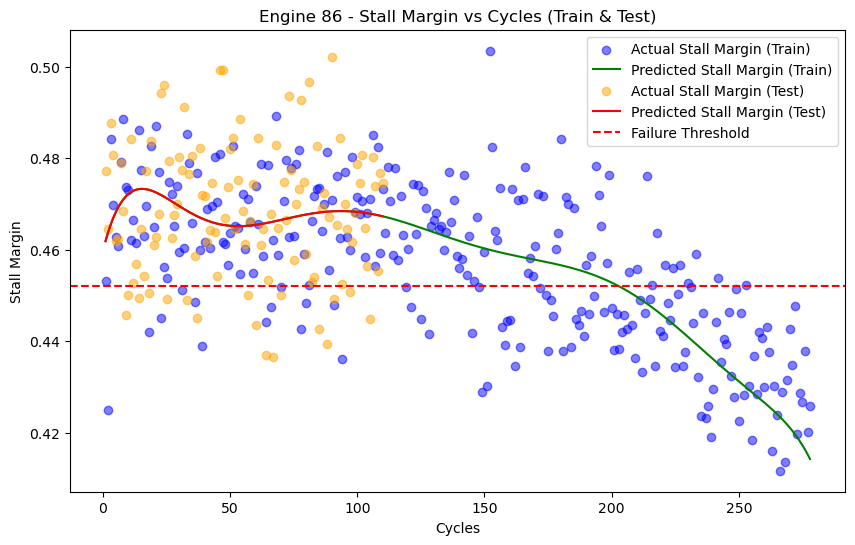

Engine 86 - R2 score (Train): 0.46723433324616015
Training: Stall margin breaches the threshold at cycle 216, predicted value 0.44738239443457467
Remaining useful life (Train): 62
mse train: 0.00014238190263757782
mse_test: 0.0003195749409493081


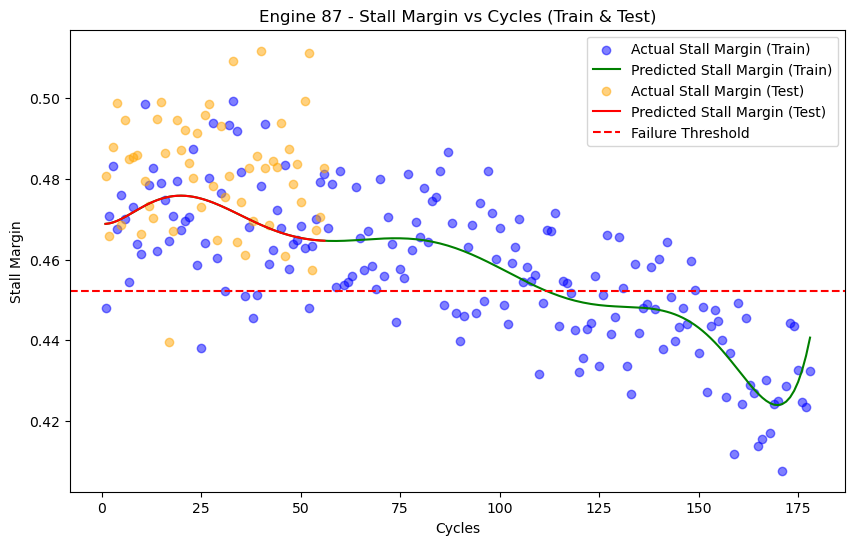

Engine 87 - R2 score (Train): 0.577897511920169
Training: Stall margin breaches the threshold at cycle 141, predicted value 0.4473278405402847
Remaining useful life (Train): 37
mse train: 0.00016894920591286247
mse_test: 0.00043013854820931924


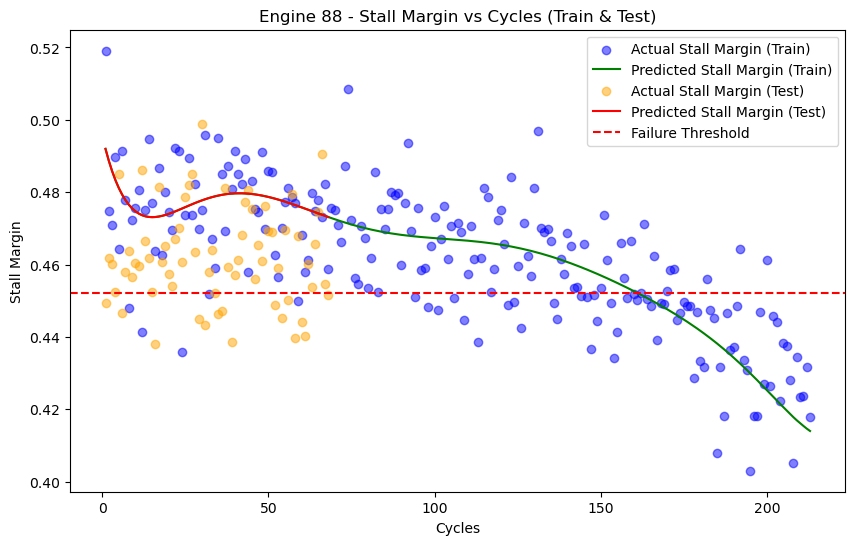

Engine 88 - R2 score (Train): 0.5633147019878142
Training: Stall margin breaches the threshold at cycle 171, predicted value 0.44709769431035884
Remaining useful life (Train): 42
mse train: 0.0001551706361998644
mse_test: 0.00021431362256980083


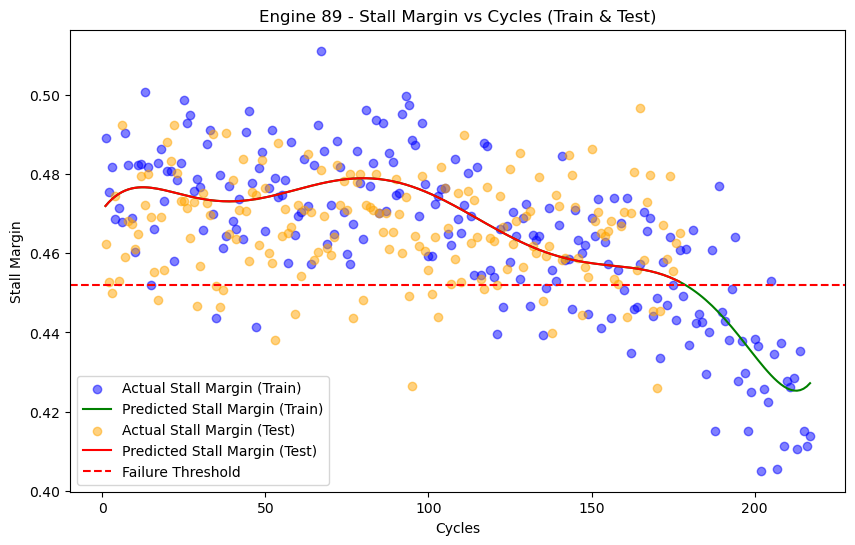

Engine 89 - R2 score (Train): 0.6387466479755992
Training: Stall margin breaches the threshold at cycle 186, predicted value 0.44747500605859836
Remaining useful life (Train): 31
mse train: 0.00014298868875959055
mse_test: 0.0002602233422686099


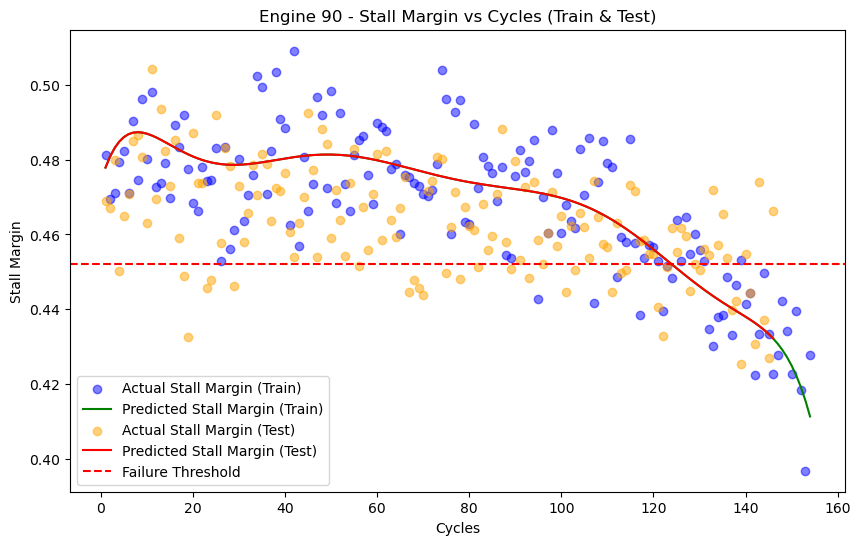

Engine 90 - R2 score (Train): 0.6434258682492564
Training: Stall margin breaches the threshold at cycle 129, predicted value 0.44707995068407264
Remaining useful life (Train): 25
Test: Stall margin breaches the threshold at cycle 124, predicted value 0.45199614178514685
Remaining useful life (Test): 22
mse train: 0.00017447299979436303
mse_test: 137.1791625273895


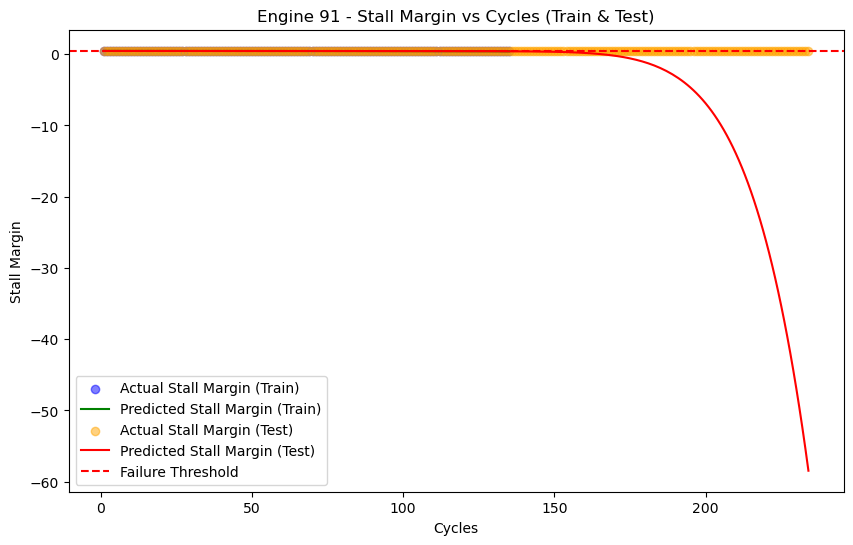

Engine 91 - R2 score (Train): 0.4411748793137733
Training: Stall margin breaches the threshold at cycle 74, predicted value 0.4474991779463429
Remaining useful life (Train): 61
Test: Stall margin breaches the threshold at cycle 62, predicted value 0.45172849862520287
Remaining useful life (Test): 172
mse train: 0.00016950539045758274
mse_test: 0.0005898019539376499


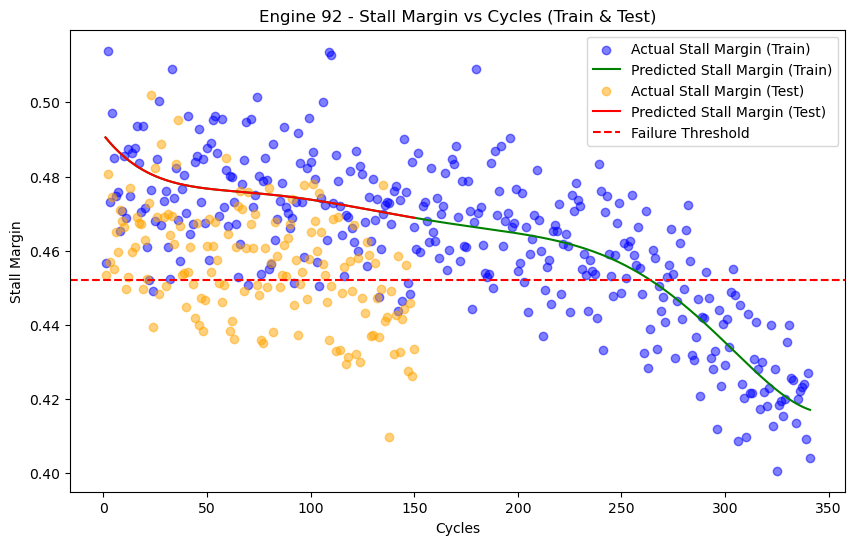

Engine 92 - R2 score (Train): 0.6271305103567761
Training: Stall margin breaches the threshold at cycle 276, predicted value 0.44724438006548295
Remaining useful life (Train): 65
mse train: 0.00017832316864775655
mse_test: 122.35196590108427


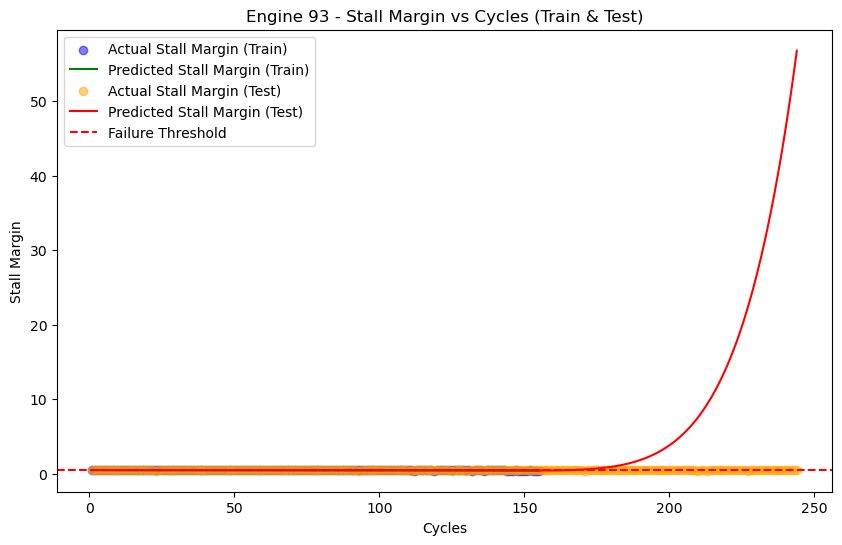

Engine 93 - R2 score (Train): 0.631158621774986
Training: Stall margin breaches the threshold at cycle 132, predicted value 0.44698678941378267
Remaining useful life (Train): 23
Test: Stall margin breaches the threshold at cycle 128, predicted value 0.4516101726973978
Remaining useful life (Test): 116
mse train: 0.0001695936395166975
mse_test: 0.00016987886199256263


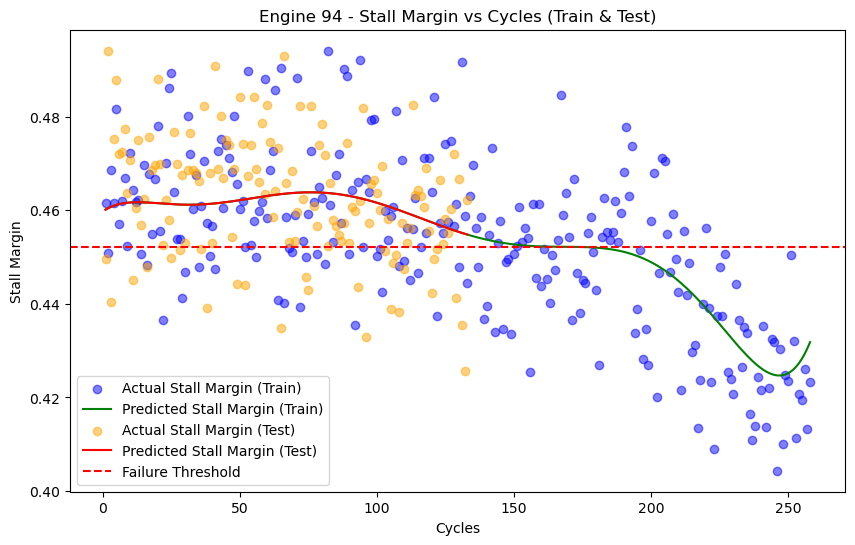

Engine 94 - R2 score (Train): 0.4828467413339915
Training: Stall margin breaches the threshold at cycle 205, predicted value 0.44715017551410147
Remaining useful life (Train): 53
mse train: 0.00016560068409704197
mse_test: 0.00016765435084482023


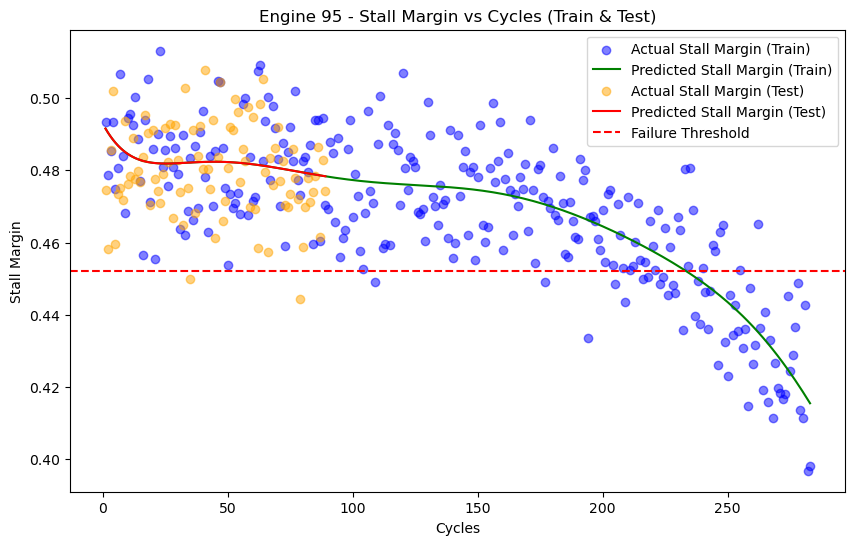

Engine 95 - R2 score (Train): 0.6439550342100561
Training: Stall margin breaches the threshold at cycle 243, predicted value 0.44742277044966194
Remaining useful life (Train): 40
mse train: 0.0001481959792454199
mse_test: 0.00019068072657590538


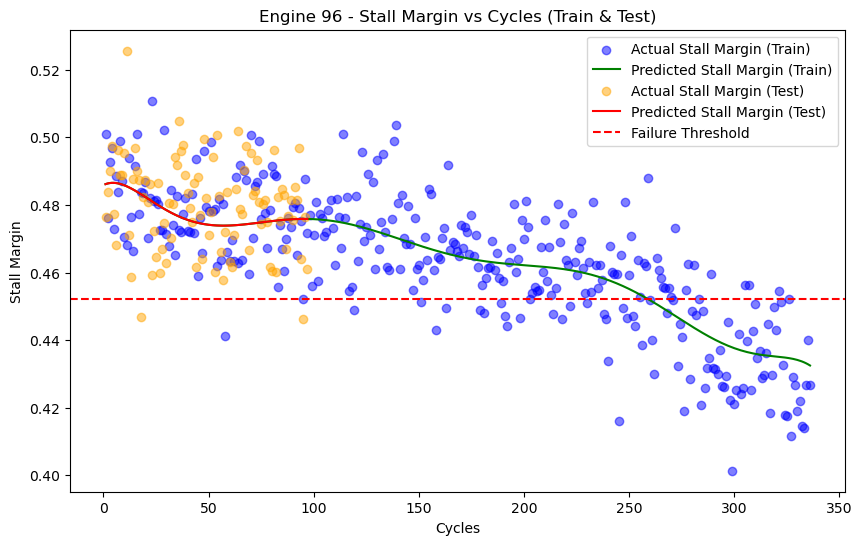

Engine 96 - R2 score (Train): 0.6269733236172835
Training: Stall margin breaches the threshold at cycle 272, predicted value 0.4471263655142572
Remaining useful life (Train): 64
mse train: 0.0001649014591443849
mse_test: 0.00014761242140572277


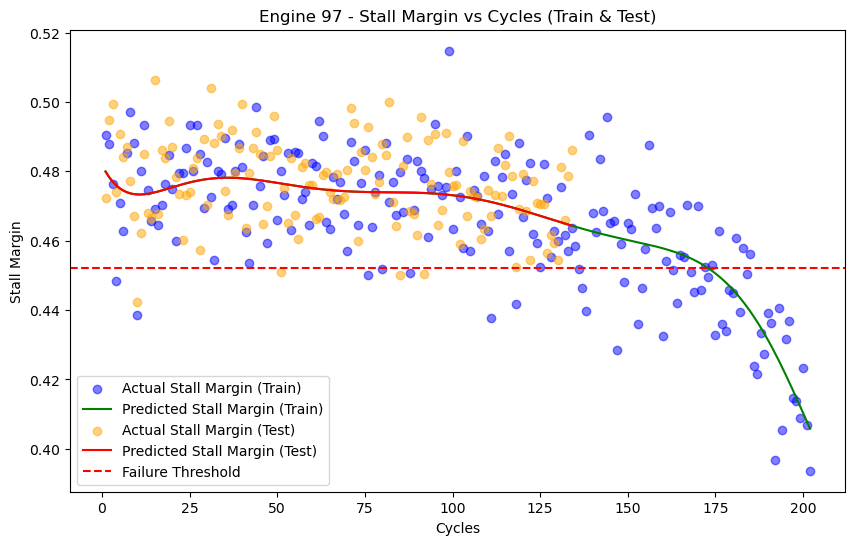

Engine 97 - R2 score (Train): 0.6050696169269455
Training: Stall margin breaches the threshold at cycle 179, predicted value 0.4469501983260099
Remaining useful life (Train): 23
mse train: 0.00015214391023146256
mse_test: 0.00020631322960995655


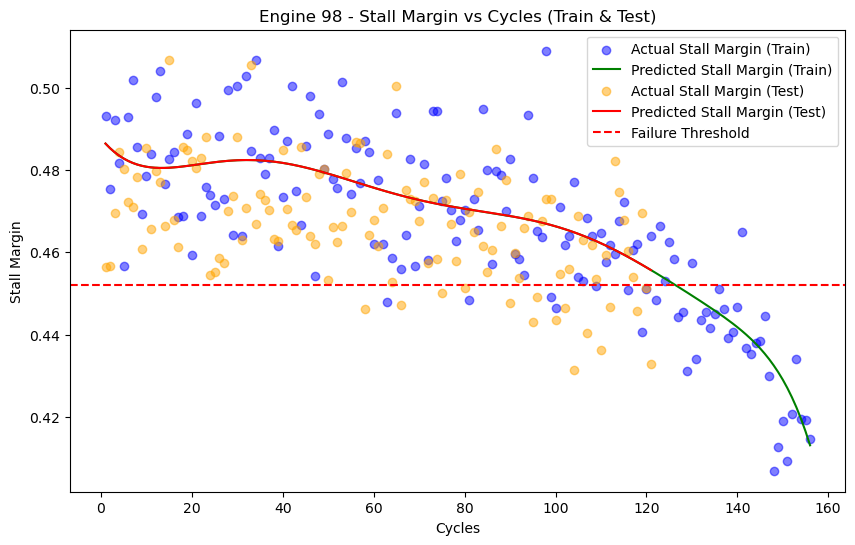

Engine 98 - R2 score (Train): 0.6701797658178033
Training: Stall margin breaches the threshold at cycle 133, predicted value 0.4473296956065094
Remaining useful life (Train): 23
mse train: 0.00013820510158298803
mse_test: 0.00024407776362953085


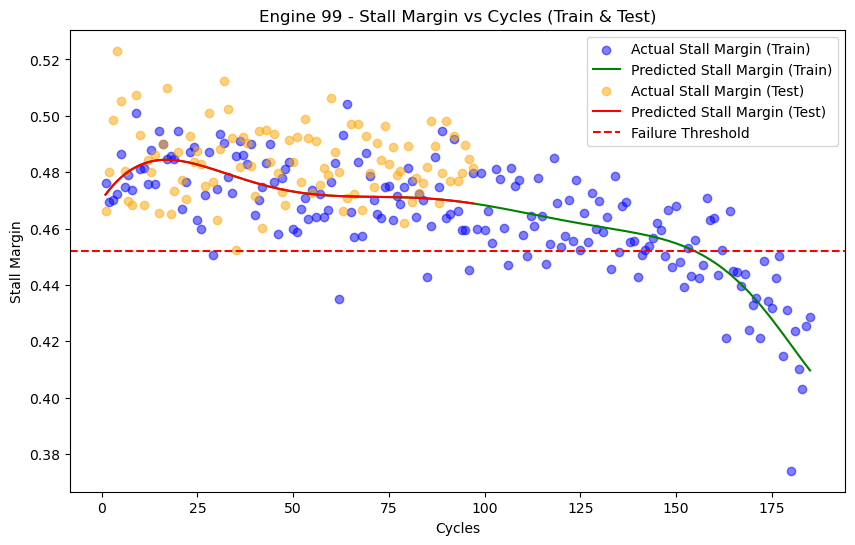

Engine 99 - R2 score (Train): 0.6344003746532378
Training: Stall margin breaches the threshold at cycle 161, predicted value 0.447089908441626
Remaining useful life (Train): 24
mse train: 0.00012842798946414278
mse_test: 0.00037259016871592026


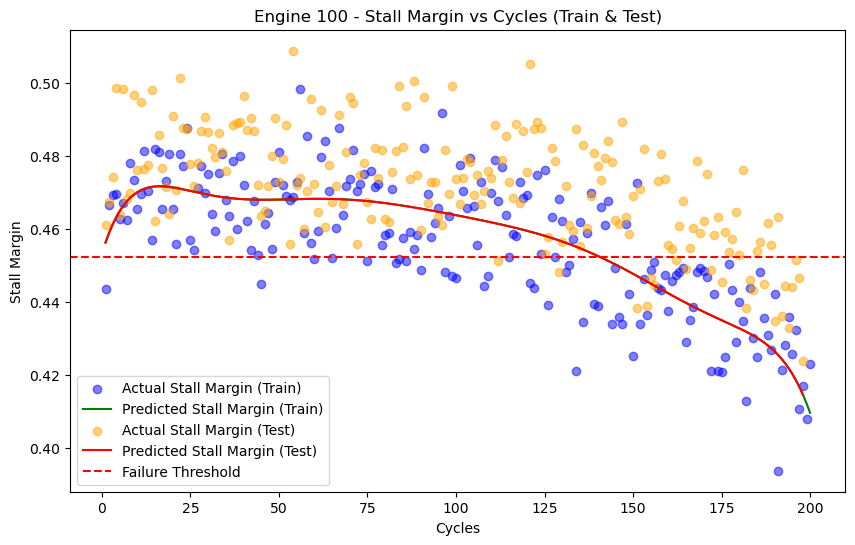

Engine 100 - R2 score (Train): 0.6135137335608389
Training: Stall margin breaches the threshold at cycle 151, predicted value 0.44708326909175966
Remaining useful life (Train): 49
Test: Stall margin breaches the threshold at cycle 141, predicted value 0.45207272920242403
Remaining useful life (Test): 57


In [8]:
# Loop through each engine and fit a model
for engine in unique_engines:
    # Filter data for the current engine in both training and test sets
    engine_train_data = FD001_data_training[FD001_data_training['Engine'] == engine]
    engine_test_data = FD001_data_test[FD001_data_test['Engine'] == engine]

    # Defining training split features
    X_train = engine_train_data[['Cycles', 'Baseline_Efficiency', 'Initial_Wear_HPT_Efficiency', 'Initial_Wear_HPT_Flow',
                                 'Wear_HPT_Efficiency_3000', 'Wear_HPT_Flow_3000', 'Wear_HPT_Efficiency_6000', 'Wear_HPT_Flow_6000', 'Engine pressure ratioP50/P2']]
    y_train = engine_train_data['stall_margin']

    # Defining test split features
    X_test = engine_test_data[['Cycles', 'Baseline_Efficiency', 'Initial_Wear_HPT_Efficiency', 'Initial_Wear_HPT_Flow',
                               'Wear_HPT_Efficiency_3000', 'Wear_HPT_Flow_3000', 'Wear_HPT_Efficiency_6000', 'Wear_HPT_Flow_6000', 'Engine pressure ratioP50/P2']]
    y_test = engine_test_data['stall_margin']

    # Polynomial model pipeline
    poly_pipe = Pipeline([('poly', PolynomialFeatures(degree=8)), ('lin', LinearRegression())])
    poly_pipe.fit(X_train, y_train)

    # Predict for training and test data
    y_train_pred = poly_pipe.predict(X_train)
    y_test_pred = poly_pipe.predict(X_test)
    mse_train = mean_squared_error(y_train,y_train_pred) 
    mse_test = mean_squared_error(y_test,y_test_pred)
    print(f'mse train: {mse_train}')
    print(f'mse_test: {mse_test}')

    r2_poly_train = r2_score(y_train, y_train_pred)
    r2_scores_data.append(r2_poly_train)

    # Store the model and data
    engine_result = {
        'engine': engine,
        'model': poly_pipe,
        'y_train': y_train,
        'y_train_pred': y_train_pred,
        'y_test': y_test,
        'y_test_pred': y_test_pred
    }

    # Find the first cycle where the predicted stall margin falls below the failure threshold (train)
    try:
        breach_index_train = np.where(y_train_pred <= stall_margin_failure_threshold_training)[0][0]
        breach_cycle_train = engine_train_data['Cycles'].values[breach_index_train]
        engine_result['breach_index_train'] = breach_index_train
        engine_result['breach_cycle_train'] = breach_cycle_train
    except IndexError:
        engine_result['breach_index_train'] = None
        engine_result['breach_cycle_train'] = None

    # Find the first cycle where the predicted stall margin falls below the failure threshold (test)
    try:
        breach_index_test = np.where(y_test_pred <= stall_margin_failure_threshold_test)[0][0]
        breach_cycle_test = engine_test_data['Cycles'].values[breach_index_test]
        engine_result['breach_index_test'] = breach_index_test
        engine_result['breach_cycle_test'] = breach_cycle_test
    except IndexError:
        engine_result['breach_index_test'] = None
        engine_result['breach_cycle_test'] = None
        
    # Plotting the training and test set predictions
    plt.figure(figsize=(10, 6))
    
    # Training data
    plt.scatter(engine_train_data['Cycles'], y_train, color='blue', alpha=0.5, label='Actual Stall Margin (Train)')
    plt.plot(engine_train_data['Cycles'], y_train_pred, color='green', label='Predicted Stall Margin (Train)')

    # Test data
    plt.scatter(engine_test_data['Cycles'], y_test, color='orange', alpha=0.5, label='Actual Stall Margin (Test)')
    plt.plot(engine_test_data['Cycles'], y_test_pred, color='red', label='Predicted Stall Margin (Test)')
    
    # Failure threshold line
    plt.axhline(stall_margin_failure_threshold_test, color='red', linestyle='--', label='Failure Threshold')

    # Titles and labels
    plt.title(f'Engine {engine} - Stall Margin vs Cycles (Train & Test)')
    plt.xlabel('Cycles')
    plt.ylabel('Stall Margin')
    plt.legend()
    
    # Show plot
    plt.show()

    # Print the R2 score for the training data
    print(f'Engine {engine} - R2 score (Train): {r2_poly_train}')

    # Print breach information
    if engine_result['breach_cycle_train'] is not None:
        remaining_rul_train = engine_train_data['Cycles'].max() - engine_result['breach_cycle_train']
        print(f"Training: Stall margin breaches the threshold at cycle {engine_result['breach_cycle_train']}, predicted value {y_train_pred[breach_index_train]}")
        print(f'Remaining useful life (Train): {remaining_rul_train}')
    
    if engine_result['breach_cycle_test'] is not None:
        remaining_rul_test = engine_test_data['Cycles'].max() - engine_result['breach_cycle_test']
        print(f"Test: Stall margin breaches the threshold at cycle {engine_result['breach_cycle_test']}, predicted value {y_test_pred[breach_index_test]}")
        print(f'Remaining useful life (Test): {remaining_rul_test}')

